### fixed sd

Iteration 10/1000, Average Rewards: [0.07465713558538217, 0.06757311149219916]


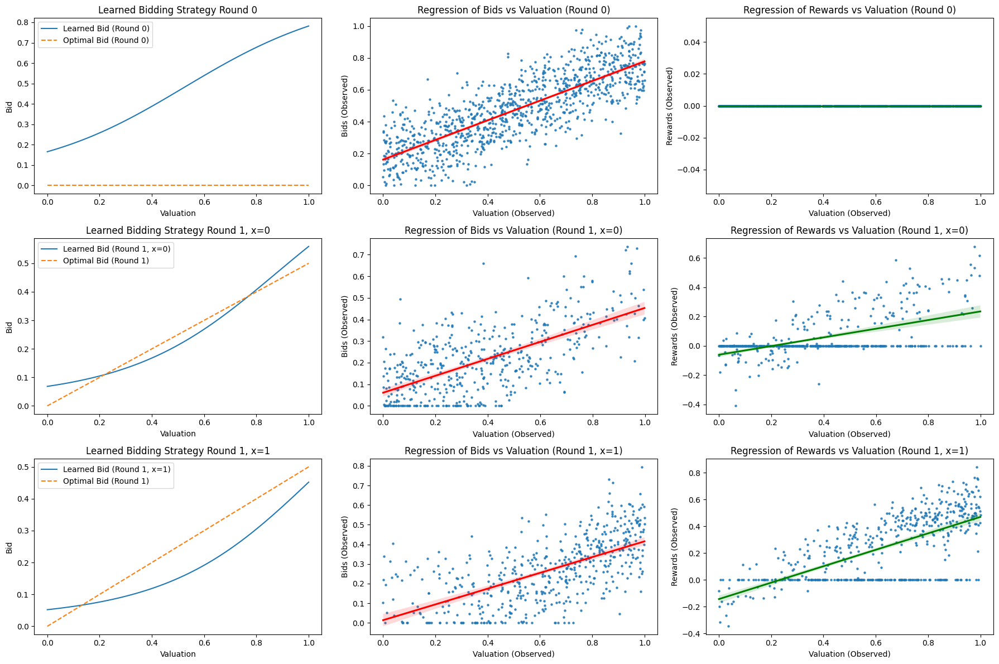

Iteration 20/1000, Average Rewards: [0.07841240625576712, 0.07995152548034534]


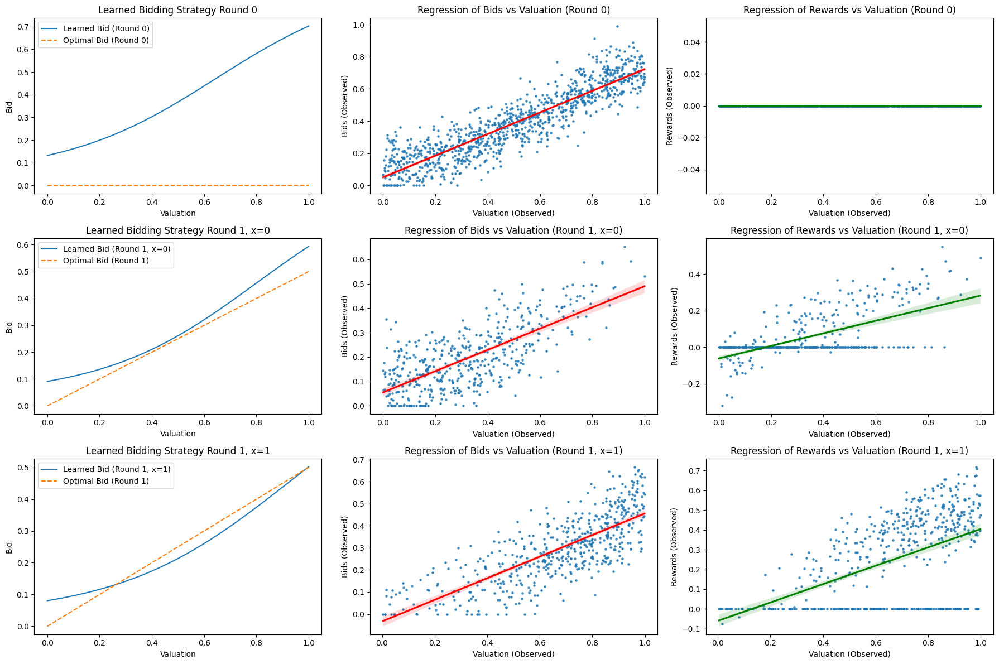

Iteration 30/1000, Average Rewards: [0.07805826765858828, 0.06778354018490115]


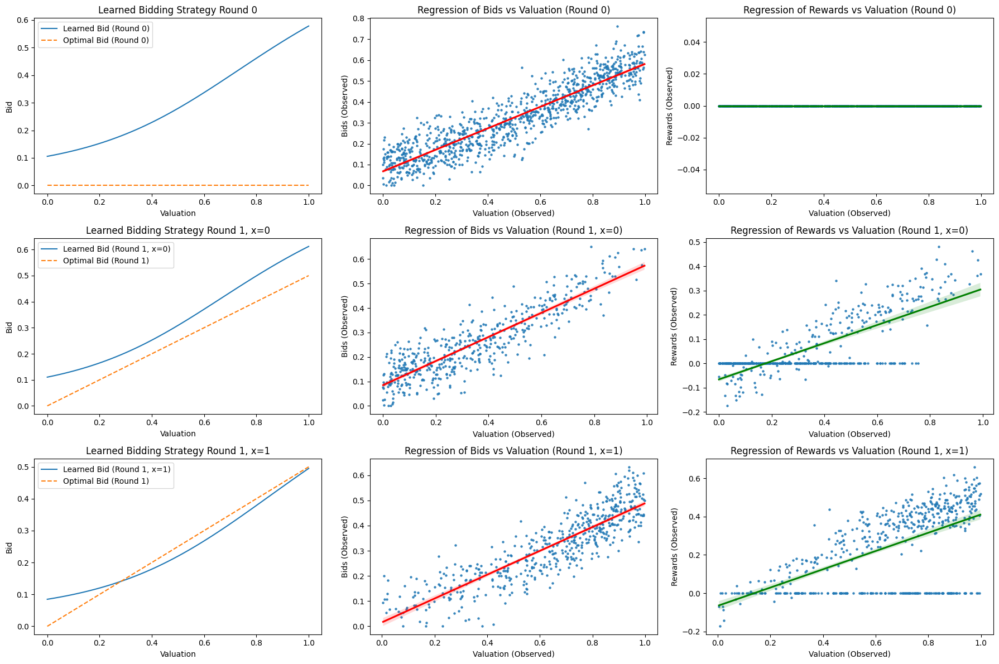

Iteration 40/1000, Average Rewards: [0.07405656034746652, 0.07593715388847604]


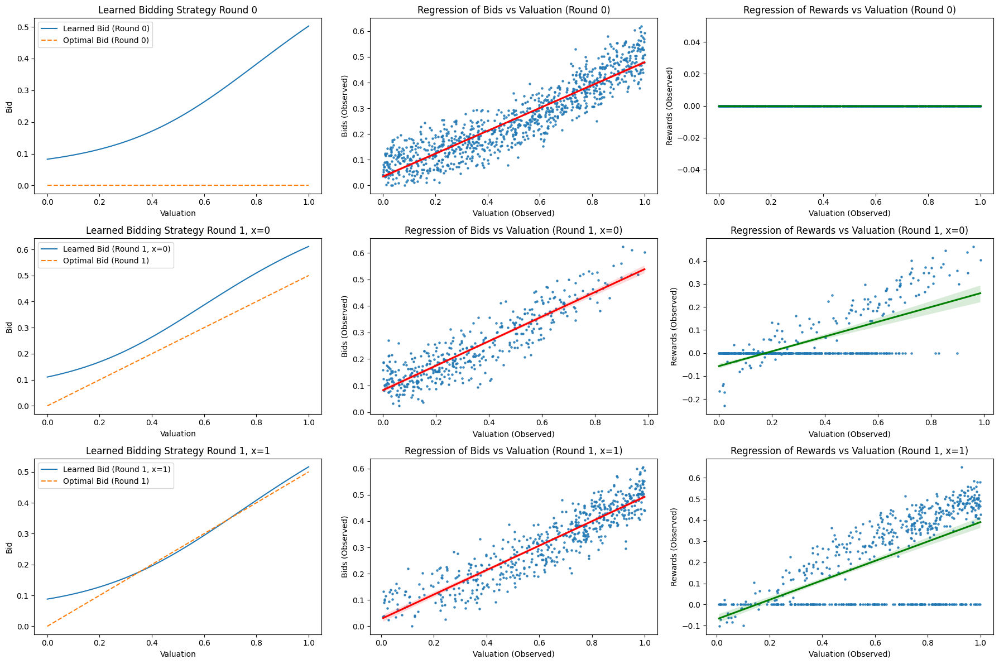

Iteration 50/1000, Average Rewards: [0.07889815547129228, 0.07386921337590256]


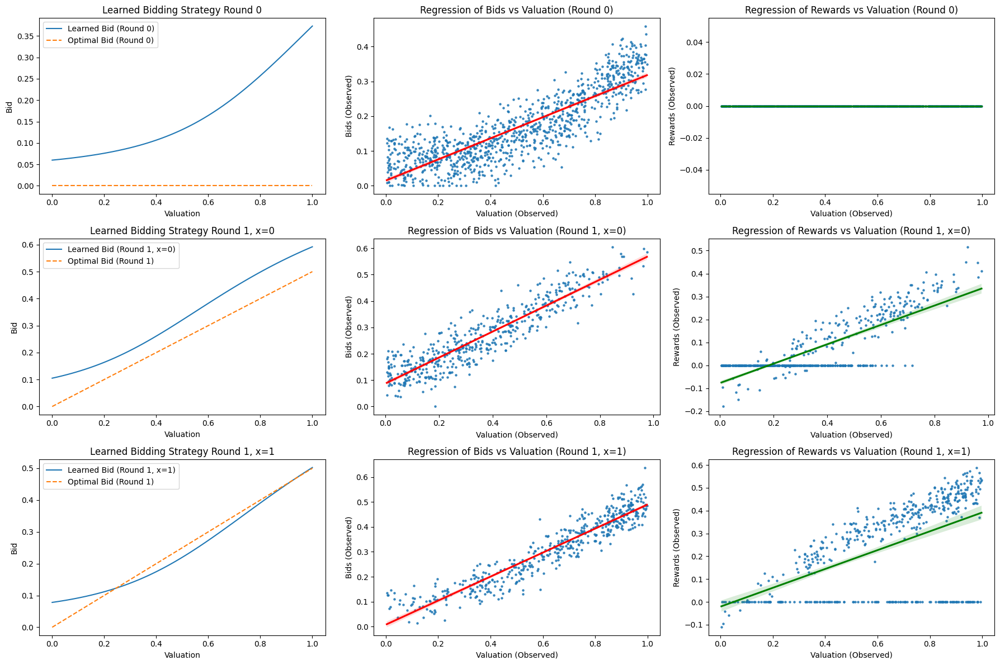

Iteration 60/1000, Average Rewards: [0.07481121534493261, 0.07465360472493937]


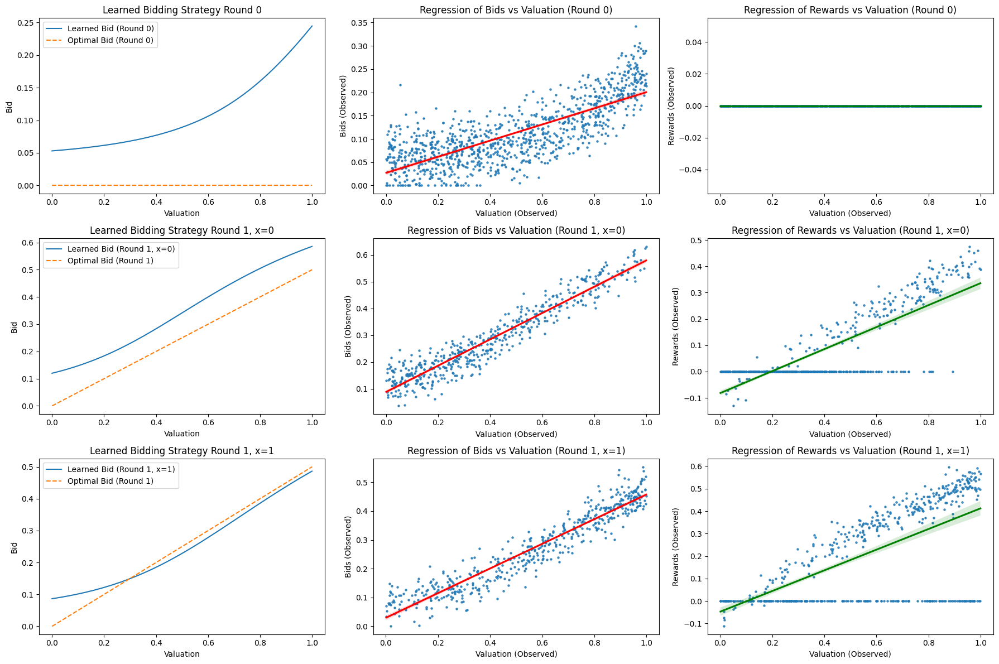

Iteration 70/1000, Average Rewards: [0.08424323793614674, 0.07429384488917792]


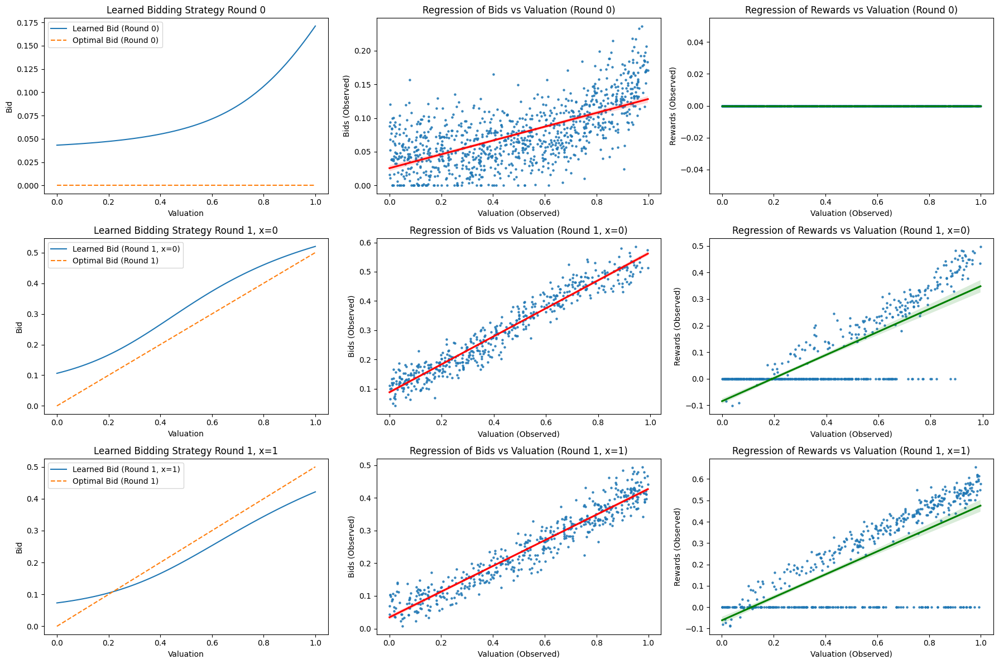

Iteration 80/1000, Average Rewards: [0.0841600404954843, 0.07426380721909573]


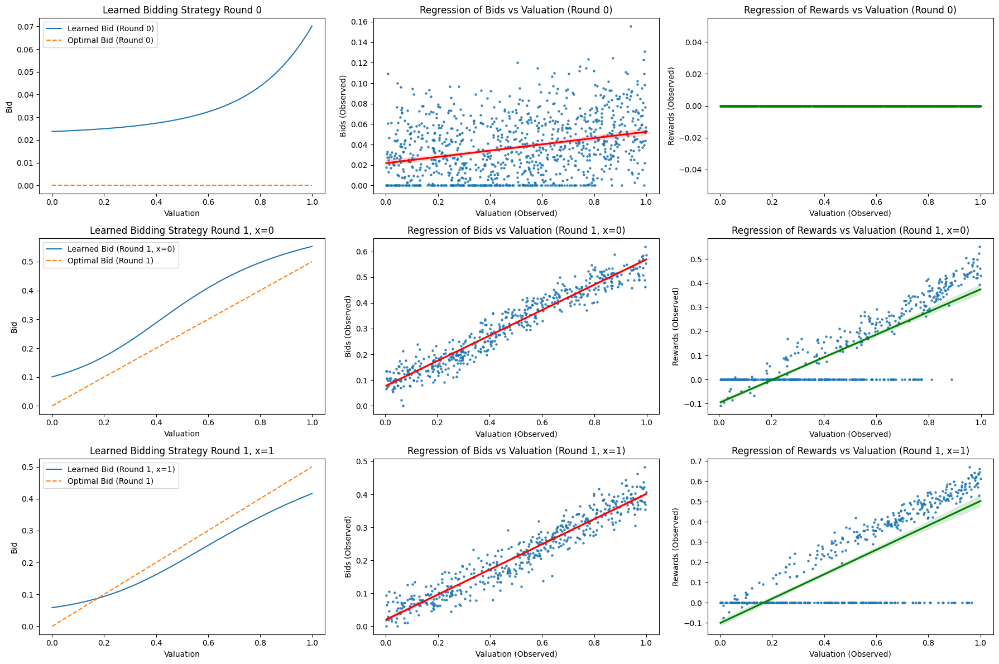

Iteration 90/1000, Average Rewards: [0.07517535831679506, 0.06974220490667862]


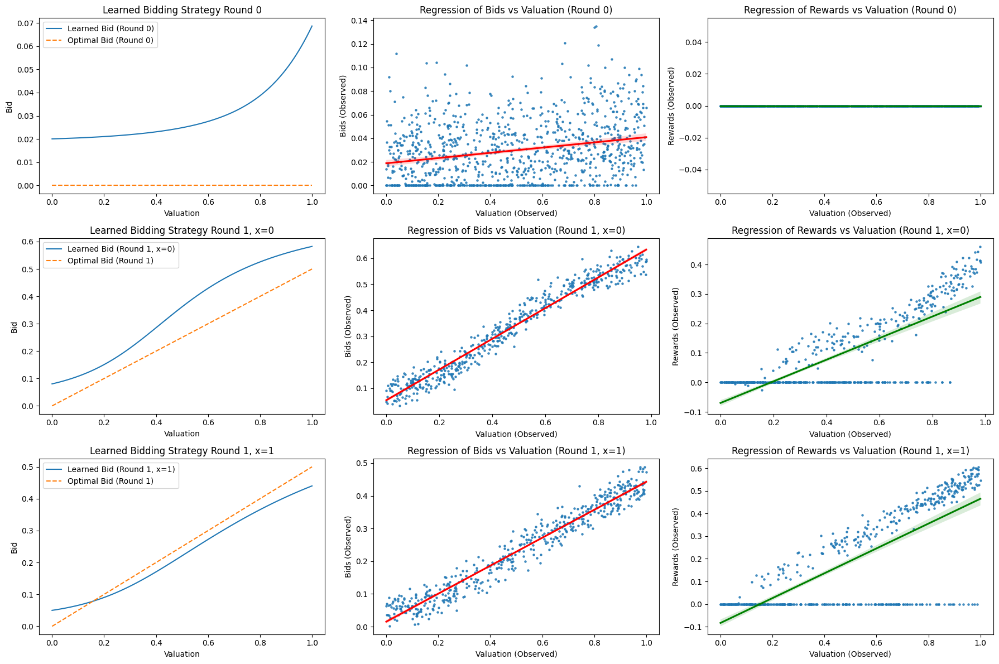

Iteration 100/1000, Average Rewards: [0.062229778371713486, 0.07339289150803192]


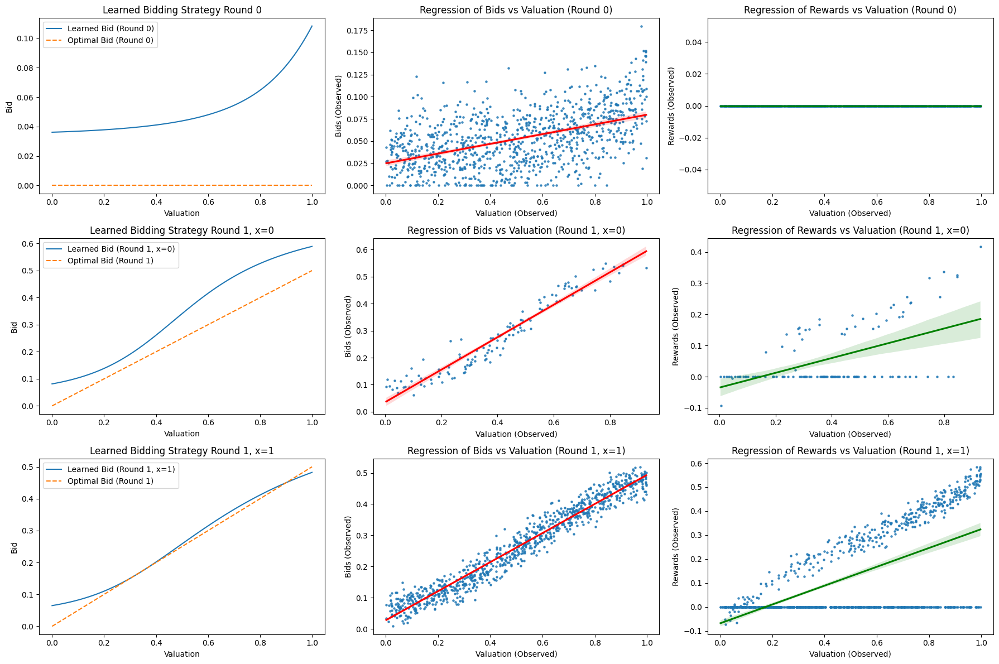

Iteration 110/1000, Average Rewards: [0.11053786180726068, 0.08297513654813794]


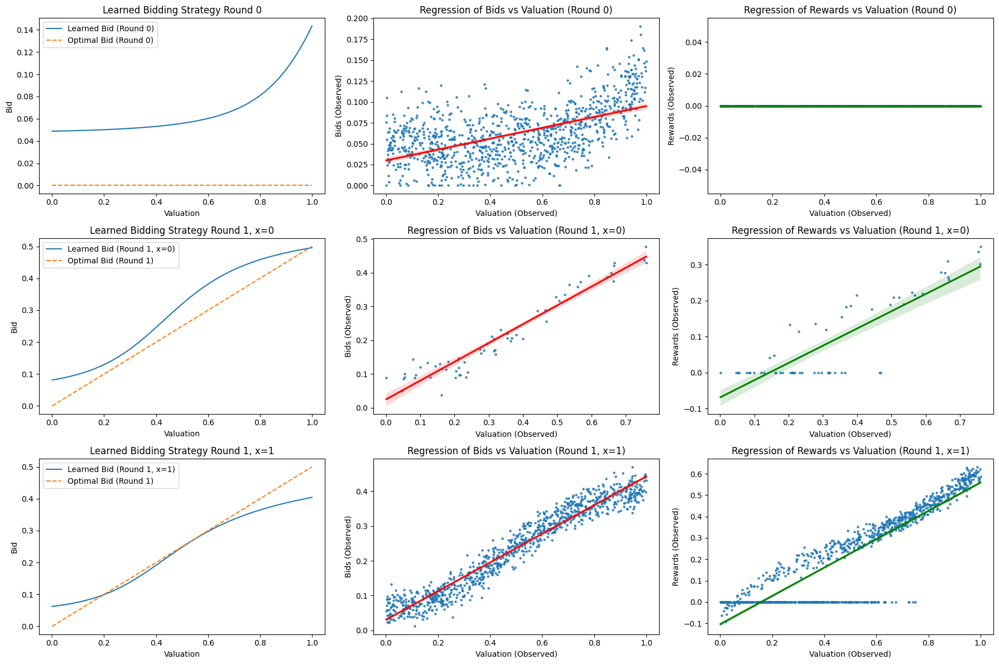

Iteration 120/1000, Average Rewards: [0.11059380426221198, 0.09067828712884392]


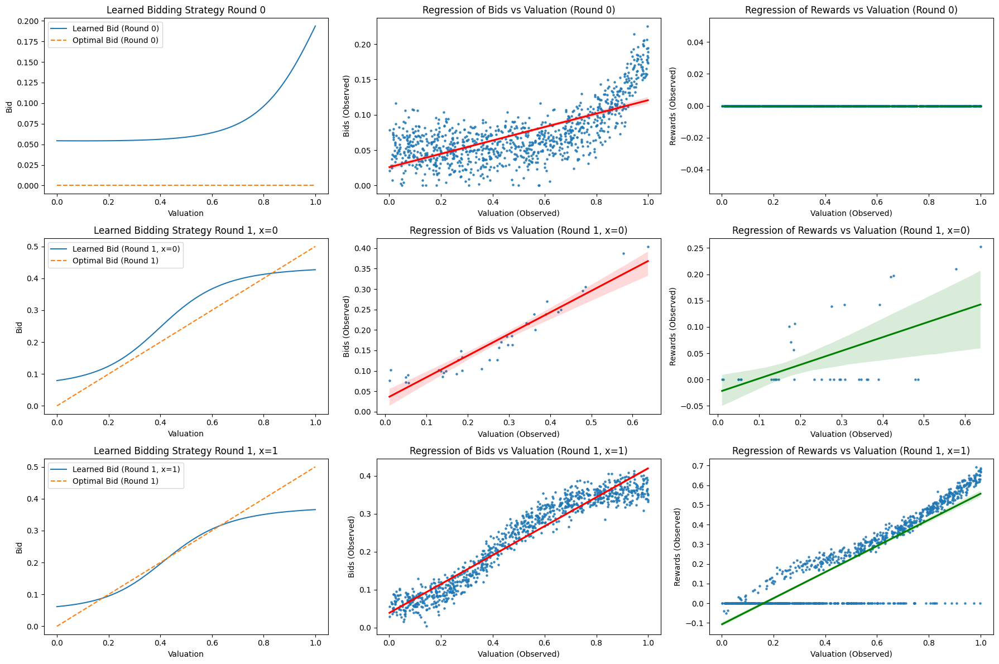

Iteration 130/1000, Average Rewards: [0.1073887256155963, 0.0795213309653244]


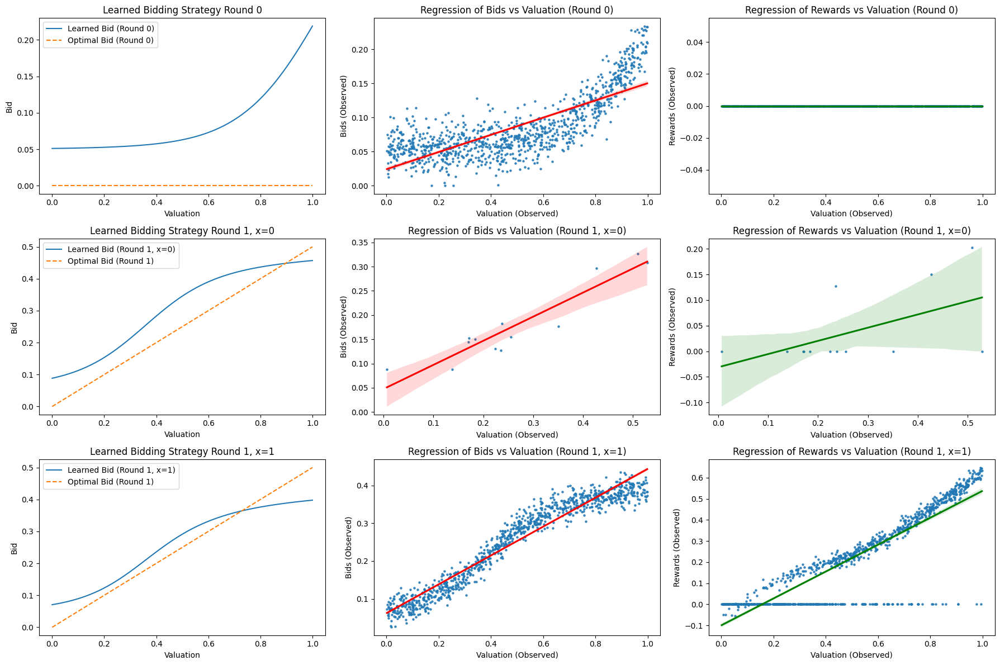

Iteration 140/1000, Average Rewards: [0.1057268602643668, 0.08588128960826155]


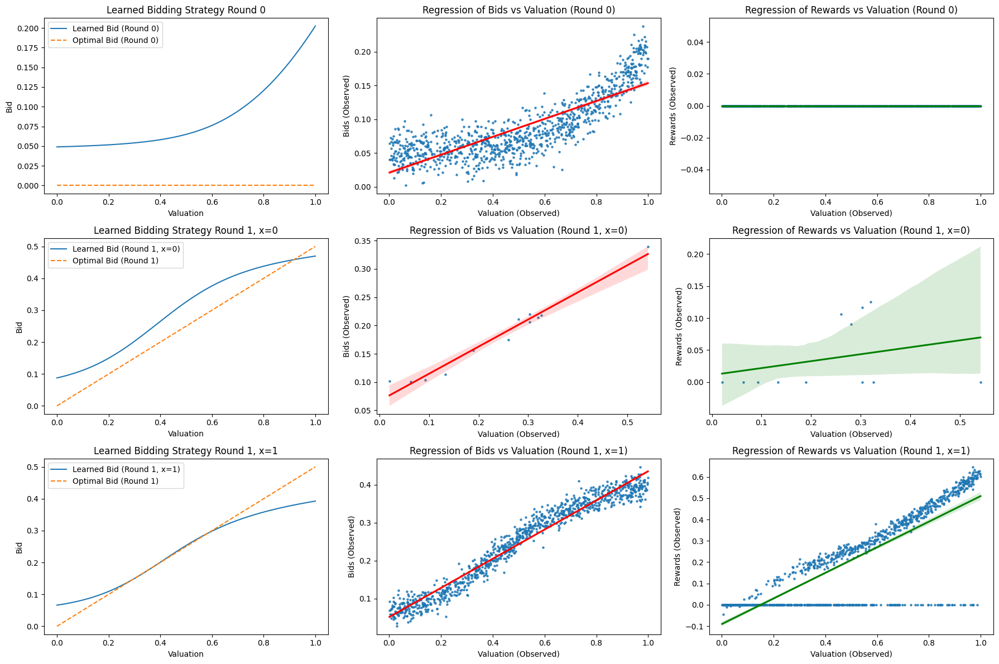

KeyboardInterrupt: 

In [6]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from torch.distributions.normal import Normal
import gym
from gym import spaces
import matplotlib.pyplot as plt
import seaborn as sns

# Define the Korean Auction Environment
class KoreanAuctionEnv(gym.Env):
    def __init__(self, num_agents=2, valuation_distribution=lambda: np.random.uniform(0, 1),
                 epsilon_reward=0.01, win_reward=0.01, tie_break_x0=True):
        super(KoreanAuctionEnv, self).__init__()
        self.num_agents = num_agents
        # Observation space: [valuation, holds_highest_bid, time_step]
        self.observation_space = spaces.Box(low=np.array([0.0, 0.0, 0.0]),
                                            high=np.array([1.0, 1.0, 1.0]),
                                            dtype=np.float32)
        self.action_space = spaces.Box(low=0.0, high=1.0, shape=(1,), dtype=np.float32)
        self.valuation_distribution = valuation_distribution
        self.epsilon_reward = epsilon_reward
        self.win_reward = win_reward
        self.tie_break_x0 = tie_break_x0
        self.reset()

    def reset(self):
        # Each agent gets a private valuation
        self.valuations = [self.valuation_distribution() for _ in range(self.num_agents)]
        # Initialize holds_highest_bid to 0
        self.holds_highest_bid = [0 for _ in range(self.num_agents)]
        self.time_step = 0  # 0 for first round, 1 for second round
        # Observations are the valuations, holds_highest_bid, and time_step for each agent
        self.states = [np.array([v, self.holds_highest_bid[i], self.time_step], dtype=np.float32)
                       for i, v in enumerate(self.valuations)]
        return self.states

    def step(self, actions):
        bids = [np.clip(a[0], 0.0, 1.0) for a in actions]
        rewards = [0.0 for _ in range(self.num_agents)]  # Initialize rewards as 0 for all agents
        info = {}
        
        if self.time_step == 0:
            # First round: No rewards, only determine who holds the highest bid
            bids_round1 = np.array(bids)
            max_bid = np.max(bids_round1)
            winner_indices = np.where(bids_round1 == max_bid)[0]
            # Tie-breaker logic
            if len(winner_indices) > 1 and self.tie_break_x0:
                self.holds_highest_bid = [0 for _ in range(self.num_agents)]  # No one holds the highest bid in case of tie
            else:
                winner = np.random.choice(winner_indices)
                self.holds_highest_bid = [1 if i == winner else 0 for i in range(self.num_agents)]
            # Increment time_step
            self.time_step += 1
            # Update observations
            self.states = [np.array([self.valuations[i], self.holds_highest_bid[i], self.time_step], dtype=np.float32)
                           for i in range(self.num_agents)]
            done = False
            info = {'bids_round1': bids_round1}
        
        elif self.time_step == 1:
            # Second round: Actual rewards based on who wins the auction
            bids_round2 = np.array(bids)
            max_bid = np.max(bids_round2)
            winner_indices = np.where(bids_round2 == max_bid)[0]
            # Tie-breaking logic for winner selection
            winner = np.random.choice(winner_indices)
            final_price = bids_round2[winner]
            # Compute rewards for round 2
            for i in range(self.num_agents):
                if i == winner:
                    rewards[i] = self.valuations[i] - final_price + self.epsilon_reward + self.win_reward
                else:
                    rewards[i] = 0.0
            done = True
            info = {'bids_round2': bids_round2, 'winner_round2': winner, 'final_price': final_price}
            # Reset environment for next episode
            self.reset()
        
        else:
            raise ValueError("Invalid time_step in environment")
        
        next_states = self.states
        return next_states, rewards, done, info

    def render(self, mode='human'):
        pass

# Define the PPO Agent
class PPOAgent:
    def __init__(self, observation_space, action_space, action_bound_method='clamp', lr=3e-4):
        self.observation_space = observation_space
        self.action_space = action_space
        self.action_bound_method = action_bound_method
        self.lr = lr

        self.actor = nn.Sequential(
            nn.Linear(observation_space.shape[0], 64),
            nn.Tanh(),
            nn.Linear(64, 64),
            nn.Tanh(),
            nn.Linear(64, action_space.shape[0]),
            nn.Sigmoid(),
        )
        self.critic = nn.Sequential(
            nn.Linear(observation_space.shape[0], 64),
            nn.Tanh(),
            nn.Linear(64, 64),
            nn.Tanh(),
            nn.Linear(64, 1)
        )
        self.log_std = nn.Parameter(torch.zeros(action_space.shape[0]))

        self.optimizer = optim.Adam(self.parameters(), lr=self.lr)

    def parameters(self):
        return list(self.actor.parameters()) + list(self.critic.parameters()) + [self.log_std]

    def get_action(self, x):
        mean = self.actor(x)
        std = self.log_std.exp()*0.2
        dist = Normal(mean, std)
        action = dist.sample()
        if self.action_bound_method == 'clamp':
            action = torch.clamp(action, 0.0, 1.0)
        elif self.action_bound_method == 'sigmoid':
            action = torch.sigmoid(mean)
        elif self.action_bound_method == 'tanh':
            action = torch.tanh(mean) * 0.5 + 0.5  # Rescale tanh output to [0,1]
        elif self.action_bound_method == 'none':
            action = mean
        else:
            raise ValueError("Invalid action bound method")
        log_prob = dist.log_prob(action).sum(dim=-1)
        return action, log_prob

    def get_value(self, x):
        return self.critic(x)

    def compute_loss(self, obs_batch, actions_batch, log_probs_old, returns, advantages, epsilon=0.2):
        # Actor loss
        mean = self.actor(obs_batch)
        std = self.log_std.exp()*0.2
        dist = Normal(mean, std)
        # Apply the same action bounding during training
        if self.action_bound_method == 'clamp':
            actions_bound = torch.clamp(actions_batch, 0.0, 1.0)
        elif self.action_bound_method == 'sigmoid':
            actions_bound = torch.sigmoid(actions_batch)
        elif self.action_bound_method == 'tanh':
            actions_bound = torch.tanh(actions_batch) * 0.5 + 0.5
        elif self.action_bound_method == 'none':
            actions_bound = (actions_batch + 1)/2
        else:
            raise ValueError("Invalid action bound method")
        log_probs = dist.log_prob(actions_bound).sum(dim=-1)
        ratios = torch.exp(log_probs - log_probs_old)
        surr1 = ratios * advantages
        surr2 = torch.clamp(ratios, 1 - epsilon, 1 + epsilon) * advantages
        actor_loss = -torch.min(surr1, surr2).mean()
        # Critic loss
        values = self.critic(obs_batch).squeeze()
        critic_loss = nn.MSELoss()(values, returns)
        # Entropy bonus
        entropy = dist.entropy().sum(dim=-1).mean()
        # Total loss
        loss = actor_loss + 0.5 * critic_loss - 0.005 * entropy
        return loss

    def update(self, loss):
        self.optimizer.zero_grad()
        loss.backward()
        self.optimizer.step()

# Training Parameters
num_iterations = 1000  # Number of training iterations
batch_size = 1000       # Number of episodes per iteration
learning_rate = 3e-3
gamma = 1.0           # No discounting since rewards are immediate
epsilon = 0.3         # PPO clipping epsilon
num_epochs = 4        # PPO epochs
num_minibatches = 4   # Number of minibatches for PPO update

# Create Environment and Agents
num_agents = 2  # Two agents
env = KoreanAuctionEnv(num_agents=num_agents, epsilon_reward=0.01, win_reward=0.01, tie_break_x0=False)
agents = [PPOAgent(env.observation_space, env.action_space, action_bound_method='clamp', lr=learning_rate)
          for _ in range(num_agents)]

# Training Loop
for iteration in range(num_iterations):
    # Initialize data structures for each agent
    obs_batch = [[] for _ in range(num_agents)]  # List of observations per agent
    actions_batch = [[] for _ in range(num_agents)]
    rewards_batch = [[] for _ in range(num_agents)]
    log_probs_batch = [[] for _ in range(num_agents)]
    values_batch = [[] for _ in range(num_agents)]

    # To track observed bids and rewards for all agents
    observed_valuations = [[] for _ in range(num_agents)]
    observed_bids = [[] for _ in range(num_agents)]
    observed_rewards = [[] for _ in range(num_agents)]
    observed_rounds = [[] for _ in range(num_agents)]
    observed_holds_highest_bid = [[] for _ in range(num_agents)]

    # Collect data over batch_size episodes
    for _ in range(batch_size):
        # Reset environment
        states = env.reset()
        done = False
        # Initialize lists for this episode
        obs_episode = [[] for _ in range(num_agents)]
        actions_episode = [[] for _ in range(num_agents)]
        rewards_episode = [[] for _ in range(num_agents)]
        log_probs_episode = [[] for _ in range(num_agents)]
        values_episode = [[] for _ in range(num_agents)]
        while not done:
            actions = []
            for i in range(num_agents):
                obs = states[i]
                obs_tensor = torch.tensor(obs, dtype=torch.float32).unsqueeze(0)
                action, log_prob = agents[i].get_action(obs_tensor)
                value = agents[i].get_value(obs_tensor)

                action_np = action.detach().numpy()[0]
                actions.append(action_np)

                # Store data
                obs_episode[i].append(obs)
                actions_episode[i].append(action_np)
                log_probs_episode[i].append(log_prob.detach().numpy())
                values_episode[i].append(value.detach().numpy()[0])

            # Step environment with all actions
            next_states, rewards, done, info = env.step(actions)

            # Track observed data for all agents
            for i in range(num_agents):
                observed_valuations[i].append(states[i][0])  # Valuation for agent i
                observed_bids[i].append(actions[i])          # Bid for agent i
                observed_rewards[i].append(rewards[i])       # Reward for agent i
                observed_rounds[i].append(states[i][2])      # Round number
                observed_holds_highest_bid[i].append(states[i][1])  # Holds highest bid

            # Store rewards
            for i in range(num_agents):
                rewards_episode[i].append(rewards[i])

            # Update states
            states = next_states

        # After episode ends, append episode data to batches
        for i in range(num_agents):
            obs_batch[i].extend(obs_episode[i])
            actions_batch[i].extend(actions_episode[i])
            rewards_batch[i].extend(rewards_episode[i])
            log_probs_batch[i].extend(log_probs_episode[i])
            values_batch[i].extend(values_episode[i])

    # PPO Update for each agent
    for i in range(num_agents):
        # Flatten lists
        obs_batch_i = torch.tensor(obs_batch[i], dtype=torch.float32)
        actions_batch_i = torch.tensor(actions_batch[i], dtype=torch.float32)
        log_probs_batch_i = torch.tensor(log_probs_batch[i], dtype=torch.float32).squeeze()
        values_batch_i = torch.tensor(values_batch[i], dtype=torch.float32).squeeze()
        rewards_batch_i = rewards_batch[i]  # List of rewards

        # Compute Returns and Advantages
        returns = []
        advantages = []
        index = 0
        while index < len(rewards_batch_i):
            # Episodes are of variable length due to two steps
            rewards_ep = []
            values_ep = []
            while True:
                rewards_ep.append(rewards_batch_i[index])
                values_ep.append(values_batch_i[index])
                index += 1
                if len(rewards_ep) == 2:
                    break
            # Compute returns
            G = 0
            returns_ep = []
            for r in reversed(rewards_ep):
                G = r + gamma * G
                returns_ep.insert(0, G)
            returns.extend(returns_ep)
            # Compute advantages
            advantages_ep = torch.tensor(returns_ep, dtype=torch.float32) - torch.tensor(values_ep, dtype=torch.float32)
            advantages.extend(advantages_ep)
        returns = torch.tensor(returns, dtype=torch.float32)
        advantages = torch.stack(advantages)

        # Normalize Advantages
        advantages = (advantages - advantages.mean()) / (advantages.std() + 1e-8)

        # PPO Update
        for _ in range(num_epochs):
            indices = np.arange(len(returns))
            np.random.shuffle(indices)
            minibatch_size = len(returns) // num_minibatches
            for start in range(0, len(returns), minibatch_size):
                end = start + minibatch_size
                mb_inds = indices[start:end]

                mb_obs = obs_batch_i[mb_inds]
                mb_actions = actions_batch_i[mb_inds]
                mb_log_probs_old = log_probs_batch_i[mb_inds]
                mb_advantages = advantages[mb_inds]
                mb_returns = returns[mb_inds]

                # Compute loss
                loss = agents[i].compute_loss(mb_obs, mb_actions, mb_log_probs_old, mb_returns, mb_advantages, epsilon)

                # Update agent
                agents[i].update(loss)

    # Optional: Print progress and plot every 10 iterations
    if (iteration + 1) % 10 == 0:
        avg_rewards = [np.mean(rewards_batch[i]) for i in range(num_agents)]
        print(f"Iteration {iteration + 1}/{num_iterations}, Average Rewards: {avg_rewards}")

        # Focus only on Agent 1 (index 0)
        agent_idx = 0

        valuations = np.linspace(0, 1, 100)
        bids_agent_round0 = []
        bids_agent_round1_x0 = []
        bids_agent_round1_x1 = []
        for v in valuations:
            # For round 0 (time_step=0, holds_highest_bid doesn't matter)
            obs_tensor = torch.tensor([v, 0.0, 0.0], dtype=torch.float32).unsqueeze(0)
            with torch.no_grad():
                mean = agents[agent_idx].actor(obs_tensor)
                bid = torch.clamp(mean, 0.0, 1.0).numpy()[0][0]
            bids_agent_round0.append(bid)

            # For round 1, holds_highest_bid=0
            obs_tensor = torch.tensor([v, 0.0, 1.0], dtype=torch.float32).unsqueeze(0)
            with torch.no_grad():
                mean = agents[agent_idx].actor(obs_tensor)
                bid = torch.clamp(mean, 0.0, 1.0).numpy()[0][0]
            bids_agent_round1_x0.append(bid)

            # For round 1, holds_highest_bid=1
            obs_tensor = torch.tensor([v, 1.0, 1.0], dtype=torch.float32).unsqueeze(0)
            with torch.no_grad():
                mean = agents[agent_idx].actor(obs_tensor)
                bid = torch.clamp(mean, 0.0, 1.0).numpy()[0][0]
            bids_agent_round1_x1.append(bid)

        # Prepare data for plotting observed bids and rewards
        observed_valuations_agent = np.array(observed_valuations[agent_idx])
        observed_bids_agent = np.array(observed_bids[agent_idx])
        observed_rewards_agent = np.array(observed_rewards[agent_idx])
        observed_rounds_agent = np.array(observed_rounds[agent_idx])
        observed_holds_highest_bid_agent = np.array(observed_holds_highest_bid[agent_idx])

        # Create plots
        fig, axes = plt.subplots(3, 3, figsize=(18, 12))

        # 1. Plot the Learned Bidding Function for Agent 1 in Round 0
        axes[0, 0].plot(valuations, bids_agent_round0, label='Learned Bid (Round 0)')
        optimal_bids_round_0 = np.zeros_like(valuations)
        axes[0, 0].plot(valuations, optimal_bids_round_0, label='Optimal Bid (Round 0)', linestyle='--')
        axes[0, 0].set_xlabel('Valuation')
        axes[0, 0].set_ylabel('Bid')
        axes[0, 0].set_title('Learned Bidding Strategy Round 0')
        axes[0, 0].legend()

        # 2. Plot regression of bids vs observed valuations for Round 0
        idx_round0 = observed_rounds_agent == 0
        sns.regplot(x=observed_valuations_agent[idx_round0], y=observed_bids_agent[idx_round0],
                    scatter_kws={'s':5}, line_kws={"color":"r"}, ax=axes[0, 1])
        axes[0, 1].set_xlabel('Valuation (Observed)')
        axes[0, 1].set_ylabel('Bids (Observed)')
        axes[0, 1].set_title('Regression of Bids vs Valuation (Round 0)')

        # 3. Plot regression of rewards vs observed valuations for Round 0
        sns.regplot(x=observed_valuations_agent[idx_round0], y=observed_rewards_agent[idx_round0],
                    scatter_kws={'s':5}, line_kws={"color":"g"}, ax=axes[0, 2])
        axes[0, 2].set_xlabel('Valuation (Observed)')
        axes[0, 2].set_ylabel('Rewards (Observed)')
        axes[0, 2].set_title('Regression of Rewards vs Valuation (Round 0)')

        # 4. Plot the Learned Bidding Function for Agent 1 in Round 1 (holds_highest_bid=0)
        axes[1, 0].plot(valuations, bids_agent_round1_x0, label='Learned Bid (Round 1, x=0)')
        # Include optimal bidding rule if available
        optimal_bids_round_1 = 0.5 * valuations  # Adjust according to the theoretical optimal bid
        axes[1, 0].plot(valuations, optimal_bids_round_1, label='Optimal Bid (Round 1)', linestyle='--')
        axes[1, 0].set_xlabel('Valuation')
        axes[1, 0].set_ylabel('Bid')
        axes[1, 0].set_title('Learned Bidding Strategy Round 1, x=0')
        axes[1, 0].legend()

        # 5. Plot regression of bids vs observed valuations for Round 1, x=0
        idx_round1_x0 = (observed_rounds_agent == 1) & (observed_holds_highest_bid_agent == 0)
        sns.regplot(x=observed_valuations_agent[idx_round1_x0], y=observed_bids_agent[idx_round1_x0],
                    scatter_kws={'s':5}, line_kws={"color":"r"}, ax=axes[1, 1])
        axes[1, 1].set_xlabel('Valuation (Observed)')
        axes[1, 1].set_ylabel('Bids (Observed)')
        axes[1, 1].set_title('Regression of Bids vs Valuation (Round 1, x=0)')

        # 6. Plot regression of rewards vs observed valuations for Round 1, x=0
        sns.regplot(x=observed_valuations_agent[idx_round1_x0], y=observed_rewards_agent[idx_round1_x0],
                    scatter_kws={'s':5}, line_kws={"color":"g"}, ax=axes[1, 2])
        axes[1, 2].set_xlabel('Valuation (Observed)')
        axes[1, 2].set_ylabel('Rewards (Observed)')
        axes[1, 2].set_title('Regression of Rewards vs Valuation (Round 1, x=0)')

        # 7. Plot the Learned Bidding Function for Agent 1 in Round 1 (holds_highest_bid=1)
        axes[2, 0].plot(valuations, bids_agent_round1_x1, label='Learned Bid (Round 1, x=1)')
        axes[2, 0].plot(valuations, optimal_bids_round_1, label='Optimal Bid (Round 1)', linestyle='--')
        axes[2, 0].set_xlabel('Valuation')
        axes[2, 0].set_ylabel('Bid')
        axes[2, 0].set_title('Learned Bidding Strategy Round 1, x=1')
        axes[2, 0].legend()

        # 8. Plot regression of bids vs observed valuations for Round 1, x=1
        idx_round1_x1 = (observed_rounds_agent == 1) & (observed_holds_highest_bid_agent == 1)
        sns.regplot(x=observed_valuations_agent[idx_round1_x1], y=observed_bids_agent[idx_round1_x1],
                    scatter_kws={'s':5}, line_kws={"color":"r"}, ax=axes[2, 1])
        axes[2, 1].set_xlabel('Valuation (Observed)')
        axes[2, 1].set_ylabel('Bids (Observed)')
        axes[2, 1].set_title('Regression of Bids vs Valuation (Round 1, x=1)')

        # 9. Plot regression of rewards vs observed valuations for Round 1, x=1
        sns.regplot(x=observed_valuations_agent[idx_round1_x1], y=observed_rewards_agent[idx_round1_x1],
                    scatter_kws={'s':5}, line_kws={"color":"g"}, ax=axes[2, 2])
        axes[2, 2].set_xlabel('Valuation (Observed)')
        axes[2, 2].set_ylabel('Rewards (Observed)')
        axes[2, 2].set_title('Regression of Rewards vs Valuation (Round 1, x=1)')

        plt.tight_layout()
        plt.show()


### std

Iteration 10/1000, Average Rewards: [0.05161592876763188, 0.05124486314492337]


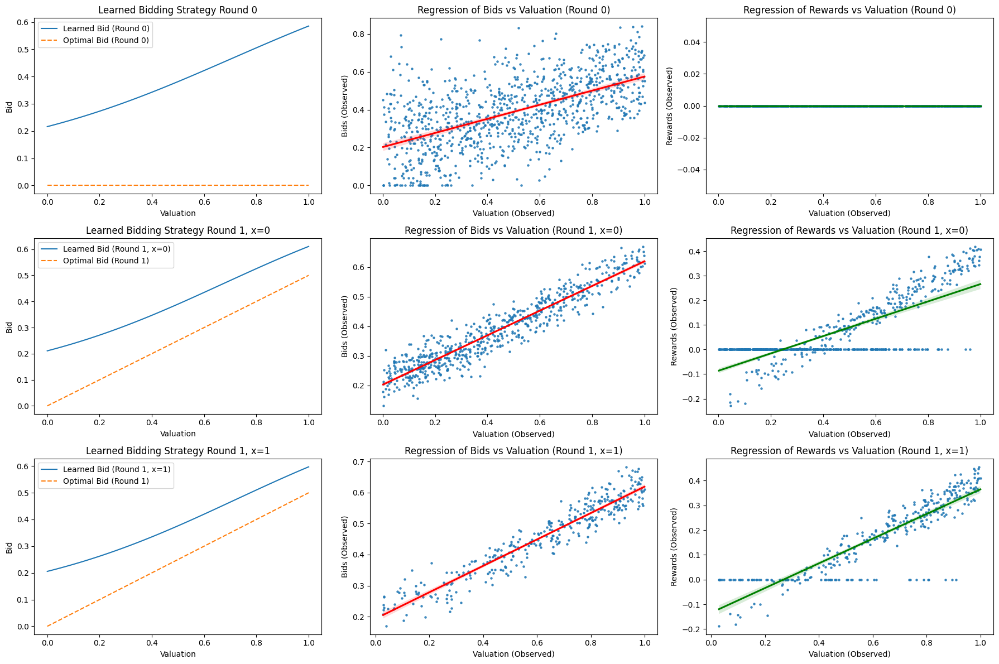

Iteration 20/1000, Average Rewards: [0.06141483738129137, 0.061647559774417625]


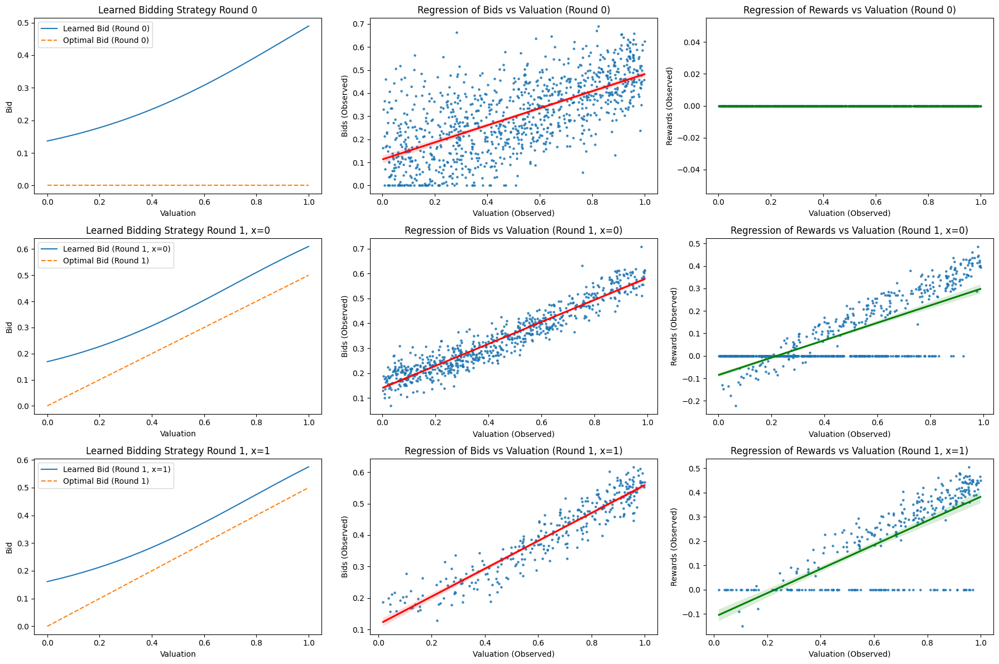

Iteration 30/1000, Average Rewards: [0.07178982274734141, 0.06683147437636944]


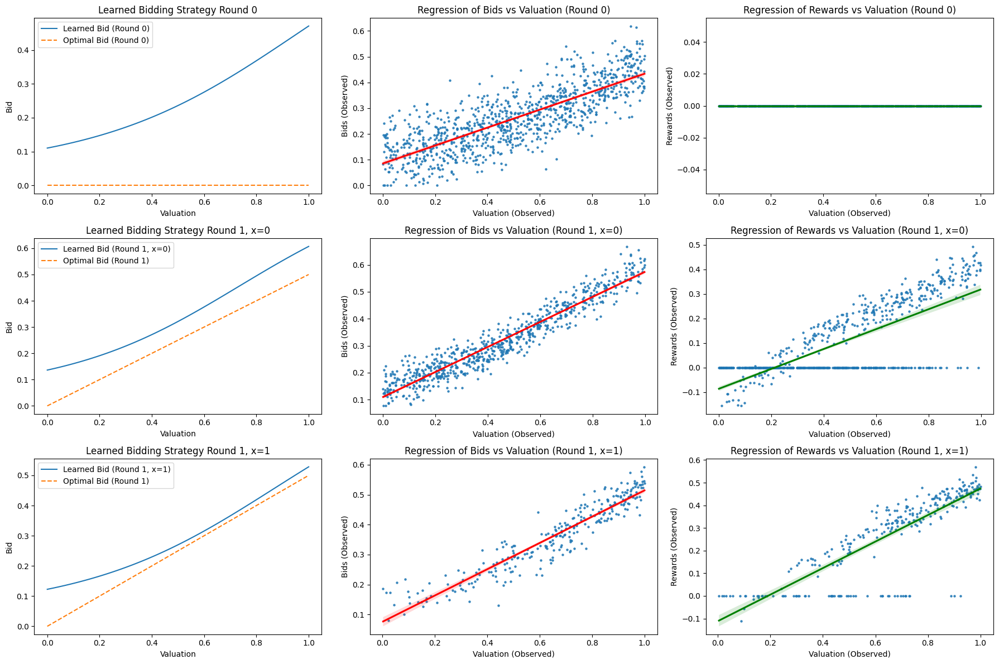

Iteration 40/1000, Average Rewards: [0.06630810108817826, 0.07555583832965976]


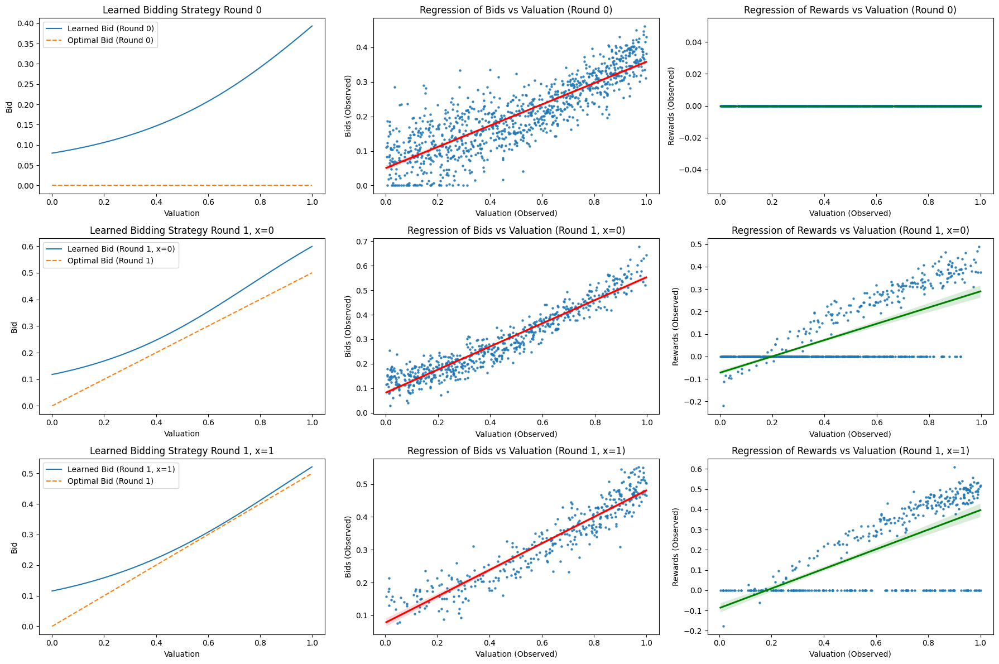

Iteration 50/1000, Average Rewards: [0.06519802766719995, 0.08160243122165244]


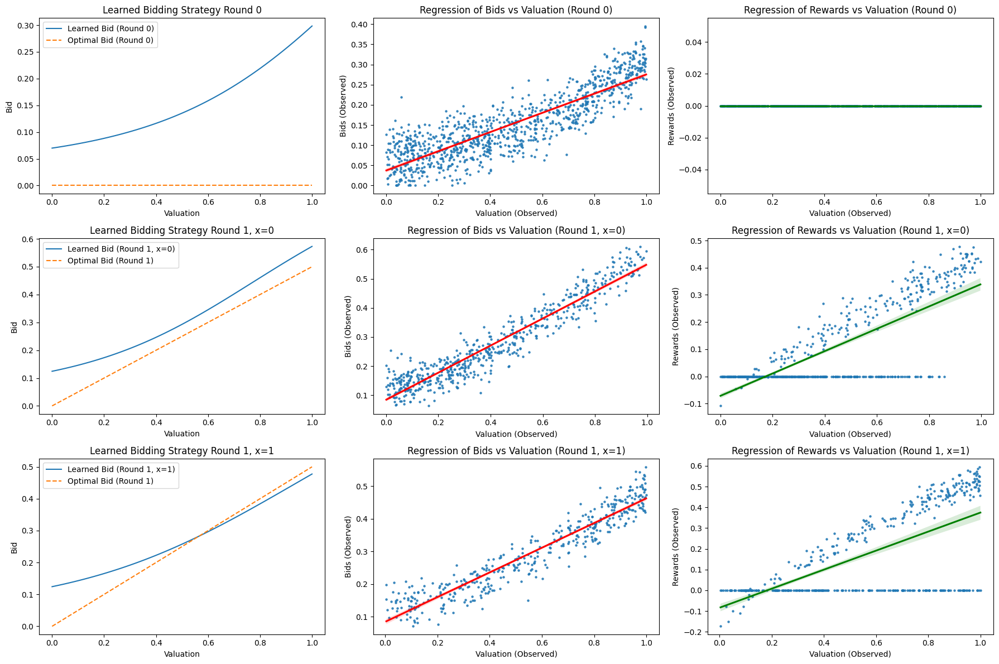

Iteration 60/1000, Average Rewards: [0.07157557855865987, 0.0794944336969028]


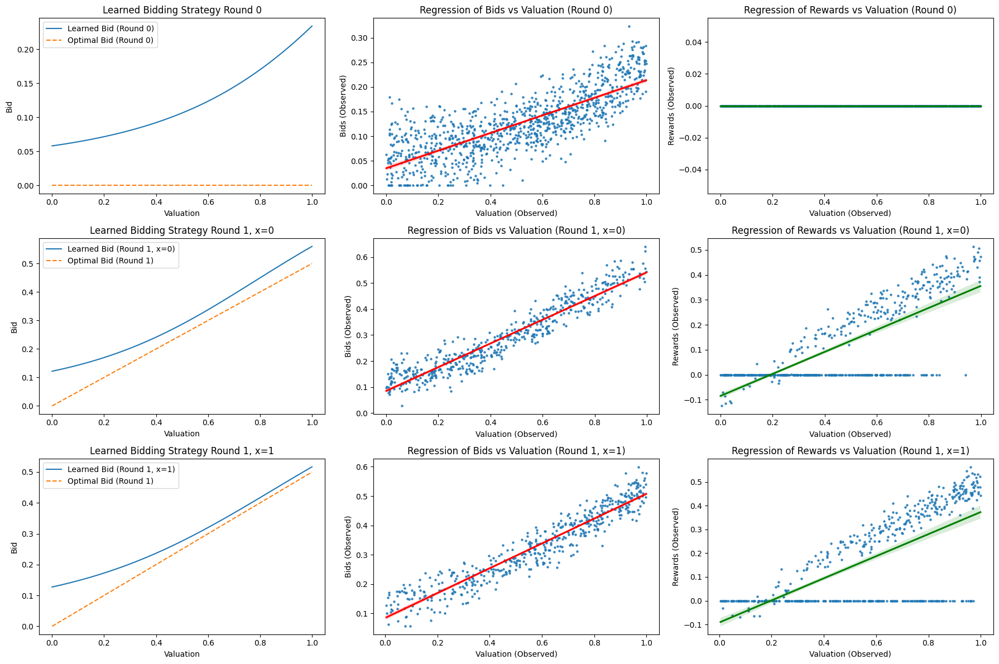

Iteration 70/1000, Average Rewards: [0.06880350848558182, 0.07593026104241292]


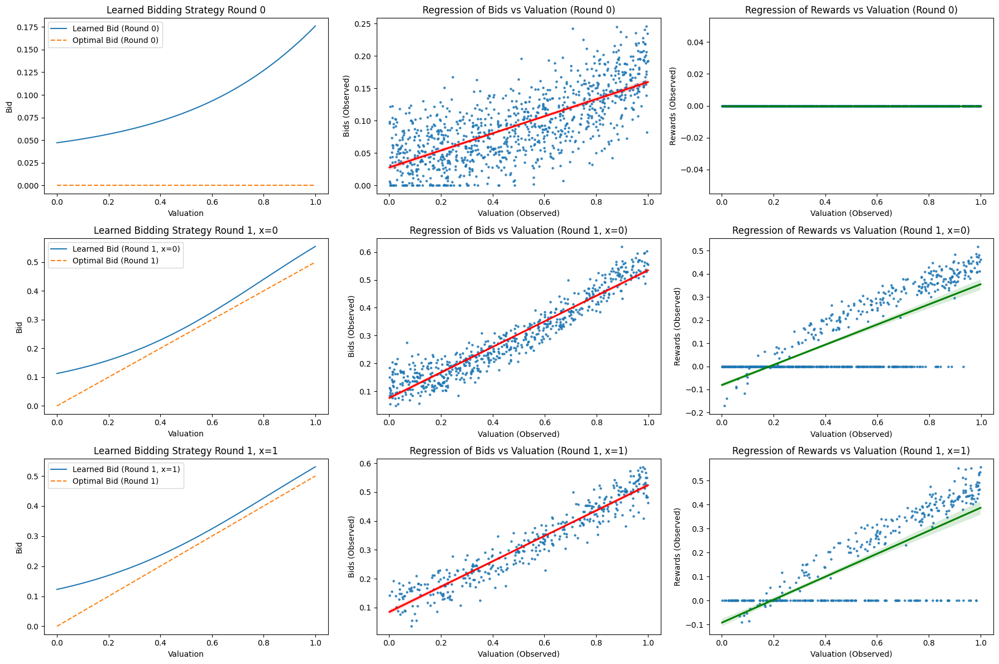

Iteration 80/1000, Average Rewards: [0.0787280239528479, 0.07636705912998662]


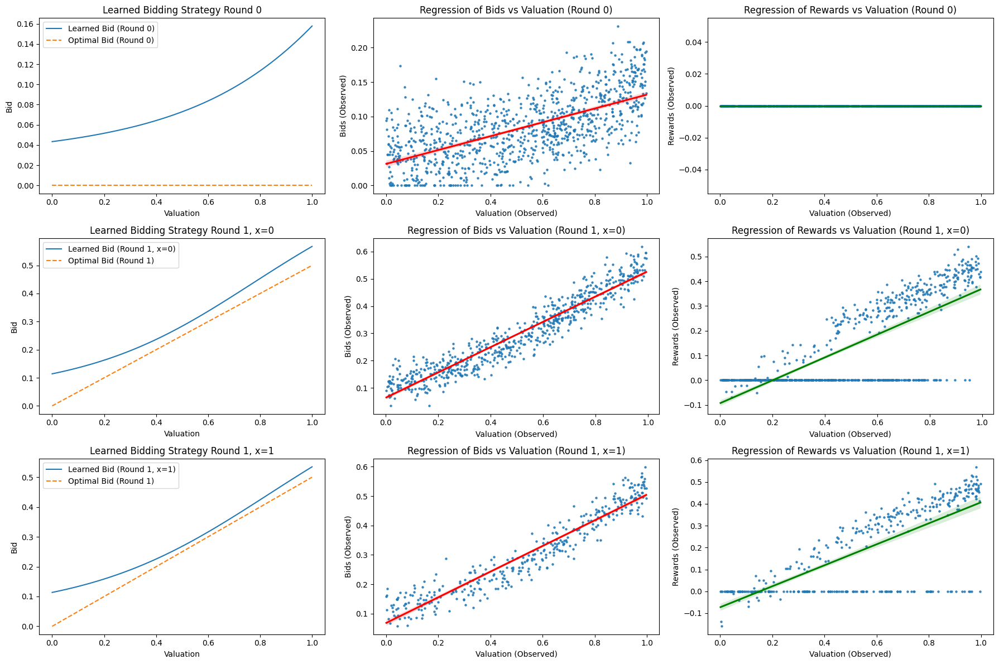

Iteration 90/1000, Average Rewards: [0.08096565216476956, 0.07819474111241718]


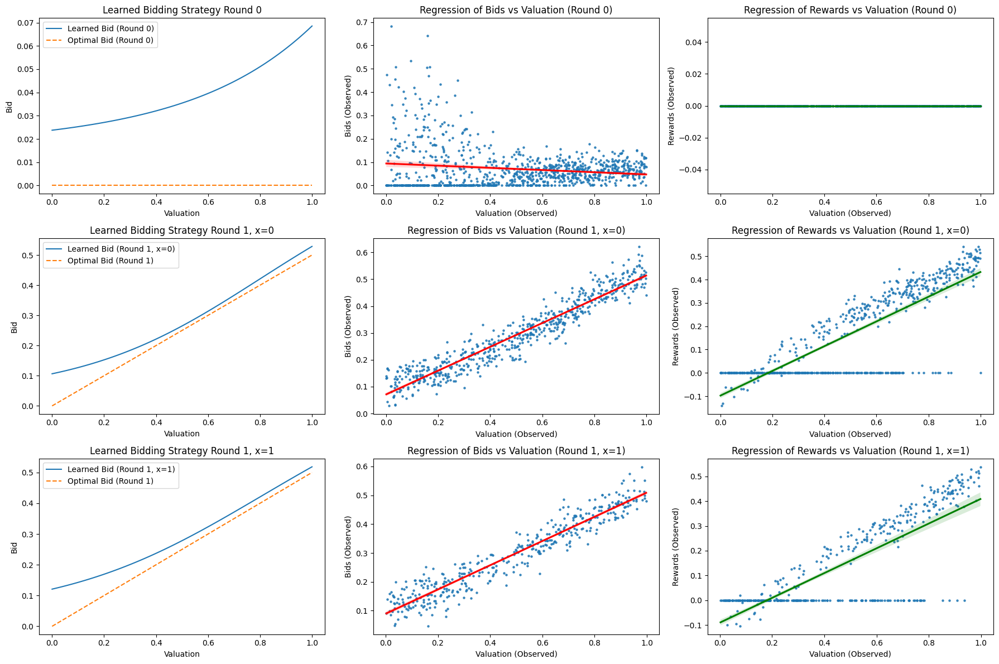

Iteration 100/1000, Average Rewards: [0.09817944700206681, 0.0739865351725885]


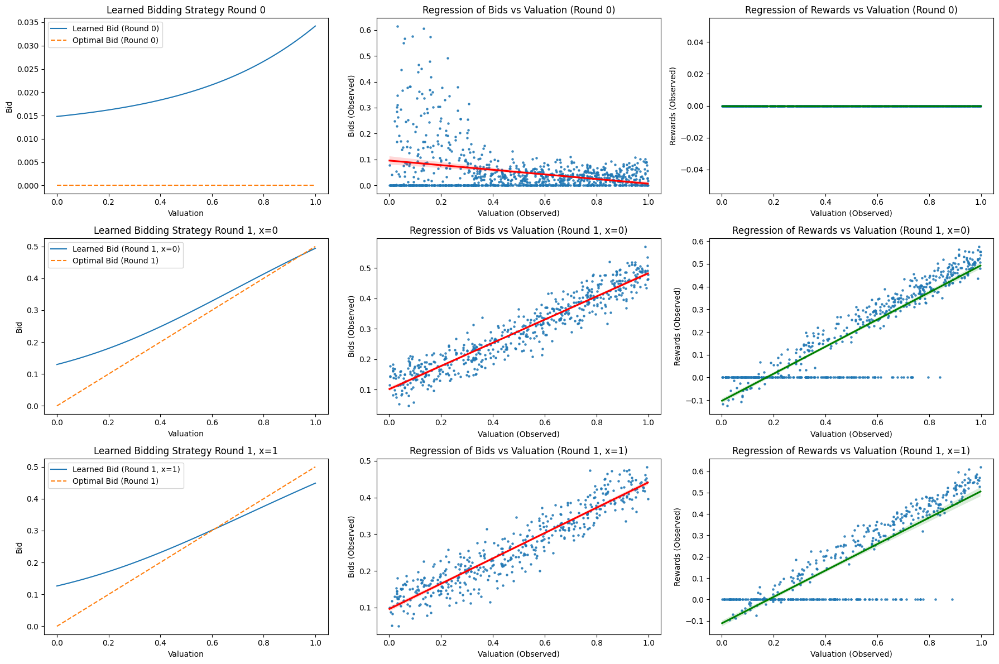

Iteration 110/1000, Average Rewards: [0.0737610180054656, 0.08097991179296592]


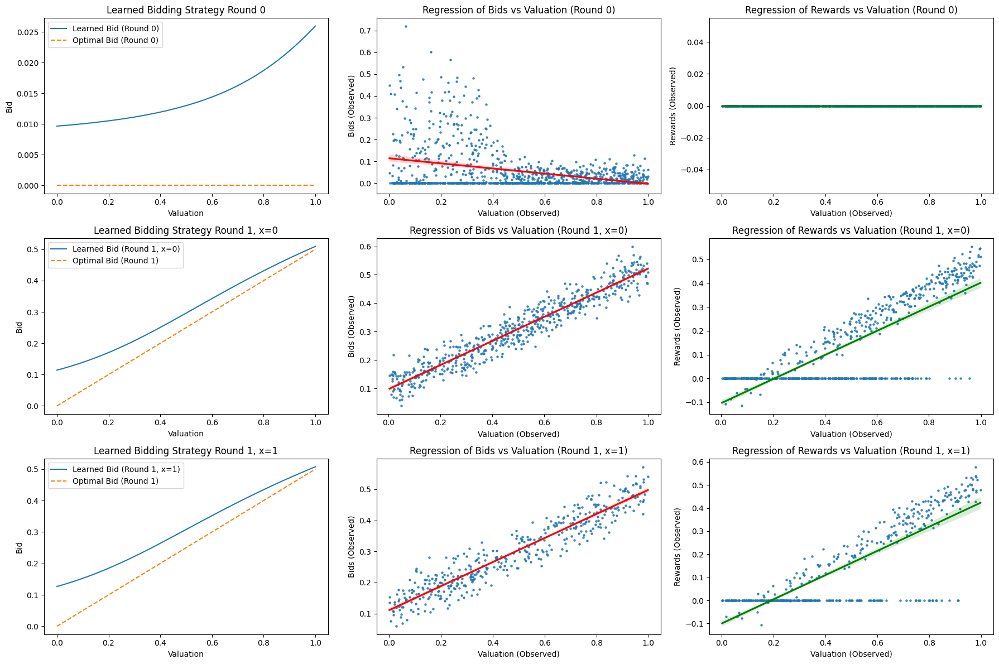

KeyboardInterrupt: 

In [16]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from torch.distributions.normal import Normal
import torch.nn.functional as F
import gym
from gym import spaces
import matplotlib.pyplot as plt
import seaborn as sns

# Define the Korean Auction Environment
class KoreanAuctionEnv(gym.Env):
    def __init__(self, num_agents=2, valuation_distribution=lambda: np.random.uniform(0, 1),
                 epsilon_reward=0.01, win_reward=0.01, tie_break_x0=True):
        super(KoreanAuctionEnv, self).__init__()
        self.num_agents = num_agents
        self.observation_space = spaces.Box(low=np.array([0.0, 0.0, 0.0]),
                                            high=np.array([1.0, 1.0, 1.0]),
                                            dtype=np.float32)
        self.action_space = spaces.Box(low=0.0, high=1.0, shape=(1,), dtype=np.float32)
        self.valuation_distribution = valuation_distribution
        self.epsilon_reward = epsilon_reward
        self.win_reward = win_reward
        self.tie_break_x0 = tie_break_x0
        self.reset()

    def reset(self):
        self.valuations = [self.valuation_distribution() for _ in range(self.num_agents)]
        self.holds_highest_bid = [0 for _ in range(self.num_agents)]
        self.time_step = 0  # 0 for first round, 1 for second round
        self.states = [np.array([v, self.holds_highest_bid[i], self.time_step], dtype=np.float32)
                       for i, v in enumerate(self.valuations)]
        return self.states

    def step(self, actions):
        bids = [np.clip(a[0], 0.0, 1.0) for a in actions]
        rewards = [0.0 for _ in range(self.num_agents)]
        info = {}

        if self.time_step == 0:
            bids_round1 = np.array(bids)
            max_bid = np.max(bids_round1)
            winner_indices = np.where(bids_round1 == max_bid)[0]
            if len(winner_indices) > 1 and self.tie_break_x0:
                self.holds_highest_bid = [0 for _ in range(self.num_agents)]
            else:
                winner = np.random.choice(winner_indices)
                self.holds_highest_bid = [1 if i == winner else 0 for i in range(self.num_agents)]
            self.time_step += 1
            self.states = [np.array([self.valuations[i], self.holds_highest_bid[i], self.time_step], dtype=np.float32)
                           for i in range(self.num_agents)]
            done = False
            info = {'bids_round1': bids_round1}

        elif self.time_step == 1:
            bids_round2 = np.array(bids)
            max_bid = np.max(bids_round2)
            winner_indices = np.where(bids_round2 == max_bid)[0]
            winner = np.random.choice(winner_indices)
            final_price = bids_round2[winner]
            for i in range(self.num_agents):
                if i == winner:
                    rewards[i] = self.valuations[i] - final_price + self.epsilon_reward + self.win_reward
                else:
                    rewards[i] = 0.0
            done = True
            info = {'bids_round2': bids_round2, 'winner_round2': winner, 'final_price': final_price}
            self.reset()

        next_states = self.states
        return next_states, rewards, done, info

    def render(self, mode='human'):
        pass


# Define the PPO Agent with state-dependent mean and std
class PPOAgent:
    def __init__(self, observation_space, action_space, action_bound_method='clamp', lr=3e-4):
        self.observation_space = observation_space
        self.action_space = action_space
        self.action_bound_method = action_bound_method
        self.lr = lr

        # Actor network outputs the mean
        self.actor_mean = nn.Sequential(
            nn.Linear(observation_space.shape[0], 64),
            nn.Tanh(),
            nn.Linear(64, 64),
            nn.Tanh(),
            nn.Linear(64, action_space.shape[0]),
            nn.Sigmoid(),  # Since actions are in [0,1], we use Sigmoid
        )

        # Separate network to output the log_std (logarithm of standard deviation)
        self.actor_log_std = nn.Sequential(
            nn.Linear(observation_space.shape[0], 64),
            nn.Tanh(),
            nn.Linear(64, 64),
            nn.Tanh(),
            nn.Linear(64, action_space.shape[0]),
            nn.Tanh(),  # Use Tanh to keep output in a reasonable range
        )

        # Critic network
        self.critic = nn.Sequential(
            nn.Linear(observation_space.shape[0], 64),
            nn.Tanh(),
            nn.Linear(64, 64),
            nn.Tanh(),
            nn.Linear(64, 1)
        )

        self.optimizer = optim.Adam(self.parameters(), lr=self.lr)

    def parameters(self):
        return list(self.actor_mean.parameters()) + list(self.actor_log_std.parameters()) + list(self.critic.parameters())

    def get_action(self, x):
        mean = self.actor_mean(x)
        log_std = self.actor_log_std(x)
        std = torch.exp(log_std)*0.1

        dist = Normal(mean, std)
        action = dist.sample()

        # Apply action bounding
        if self.action_bound_method == 'clamp':
            action = torch.clamp(action, 0.0, 1.0)
        elif self.action_bound_method == 'sigmoid':
            action = torch.sigmoid(action)
        elif self.action_bound_method == 'tanh':
            action = torch.tanh(action) * 0.5 + 0.5  # Rescale tanh output to [0,1]
        elif self.action_bound_method == 'none':
            action = action  # No action bounding
        else:
            raise ValueError("Invalid action bound method")

        log_prob = dist.log_prob(action).sum(dim=-1)
        return action, log_prob

    def get_value(self, x):
        return self.critic(x)

    def compute_loss(self, obs_batch, actions_batch, log_probs_old, returns, advantages, epsilon=0.2):
        mean = self.actor_mean(obs_batch)
        log_std = self.actor_log_std(obs_batch)
        std = torch.exp(log_std)*0.1

        dist = Normal(mean, std)

        # Apply the same action bounding during training
        if self.action_bound_method == 'clamp':
            actions_bound = torch.clamp(actions_batch, 0.0, 1.0)
        elif self.action_bound_method == 'sigmoid':
            actions_bound = torch.sigmoid(actions_batch)
        elif self.action_bound_method == 'tanh':
            actions_bound = torch.tanh(actions_batch) * 0.5 + 0.5
        elif self.action_bound_method == 'none':
            actions_bound = actions_batch
        else:
            raise ValueError("Invalid action bound method")

        log_probs = dist.log_prob(actions_bound).sum(dim=-1)
        ratios = torch.exp(log_probs - log_probs_old)
        surr1 = ratios * advantages
        surr2 = torch.clamp(ratios, 1 - epsilon, 1 + epsilon) * advantages
        actor_loss = -torch.min(surr1, surr2).mean()

        # Critic loss
        values = self.critic(obs_batch).squeeze()
        critic_loss = nn.MSELoss()(values, returns)

        # Entropy bonus
        entropy = dist.entropy().sum(dim=-1).mean()

        # Total loss
        loss = actor_loss + 0.5 * critic_loss - 0.005 * entropy
        return loss

    def update(self, loss):
        self.optimizer.zero_grad()
        loss.backward()
        self.optimizer.step()

# Training Parameters
num_iterations = 1000  # Number of training iterations
batch_size = 1000       # Number of episodes per iteration
learning_rate = 3e-3
gamma = 1.0           # No discounting since rewards are immediate
epsilon = 0.3         # PPO clipping epsilon
num_epochs = 4        # PPO epochs
num_minibatches = 4   # Number of minibatches for PPO update

# Create Environment and Agents
num_agents = 2  # Two agents
env = KoreanAuctionEnv(num_agents=num_agents, epsilon_reward=0.01, win_reward=0.01, tie_break_x0=False)
agents = [PPOAgent(env.observation_space, env.action_space, action_bound_method='clamp', lr=learning_rate)
          for _ in range(num_agents)]

# Training Loop (remains the same)
for iteration in range(num_iterations):
    # Initialize data structures for each agent
    obs_batch = [[] for _ in range(num_agents)]  # List of observations per agent
    actions_batch = [[] for _ in range(num_agents)]
    rewards_batch = [[] for _ in range(num_agents)]
    log_probs_batch = [[] for _ in range(num_agents)]
    values_batch = [[] for _ in range(num_agents)]

    # To track observed bids and rewards for all agents
    observed_valuations = [[] for _ in range(num_agents)]
    observed_bids = [[] for _ in range(num_agents)]
    observed_rewards = [[] for _ in range(num_agents)]
    observed_rounds = [[] for _ in range(num_agents)]
    observed_holds_highest_bid = [[] for _ in range(num_agents)]

    # Collect data over batch_size episodes
    for _ in range(batch_size):
        # Reset environment
        states = env.reset()
        done = False
        # Initialize lists for this episode
        obs_episode = [[] for _ in range(num_agents)]
        actions_episode = [[] for _ in range(num_agents)]
        rewards_episode = [[] for _ in range(num_agents)]
        log_probs_episode = [[] for _ in range(num_agents)]
        values_episode = [[] for _ in range(num_agents)]
        while not done:
            actions = []
            for i in range(num_agents):
                obs = states[i]
                obs_tensor = torch.tensor(obs, dtype=torch.float32).unsqueeze(0)
                action, log_prob = agents[i].get_action(obs_tensor)
                value = agents[i].get_value(obs_tensor)

                action_np = action.detach().numpy()[0]
                actions.append(action_np)

                # Store data
                obs_episode[i].append(obs)
                actions_episode[i].append(action_np)
                log_probs_episode[i].append(log_prob.detach().numpy())
                values_episode[i].append(value.detach().numpy()[0])

            # Step environment with all actions
            next_states, rewards, done, info = env.step(actions)

            # Track observed data for all agents
            for i in range(num_agents):
                observed_valuations[i].append(states[i][0])  # Valuation for agent i
                observed_bids[i].append(actions[i])          # Bid for agent i
                observed_rewards[i].append(rewards[i])       # Reward for agent i
                observed_rounds[i].append(states[i][2])      # Round number
                observed_holds_highest_bid[i].append(states[i][1])  # Holds highest bid

            # Store rewards
            for i in range(num_agents):
                rewards_episode[i].append(rewards[i])

            # Update states
            states = next_states

        # After episode ends, append episode data to batches
        for i in range(num_agents):
            obs_batch[i].extend(obs_episode[i])
            actions_batch[i].extend(actions_episode[i])
            rewards_batch[i].extend(rewards_episode[i])
            log_probs_batch[i].extend(log_probs_episode[i])
            values_batch[i].extend(values_episode[i])

    # PPO Update for each agent
    for i in range(num_agents):
        # Flatten lists
        obs_batch_i = torch.tensor(obs_batch[i], dtype=torch.float32)
        actions_batch_i = torch.tensor(actions_batch[i], dtype=torch.float32)
        log_probs_batch_i = torch.tensor(log_probs_batch[i], dtype=torch.float32).squeeze()
        values_batch_i = torch.tensor(values_batch[i], dtype=torch.float32).squeeze()
        rewards_batch_i = rewards_batch[i]  # List of rewards

        # Compute Returns and Advantages
        returns = []
        advantages = []
        index = 0
        while index < len(rewards_batch_i):
            # Episodes are of variable length due to two steps
            rewards_ep = []
            values_ep = []
            while True:
                rewards_ep.append(rewards_batch_i[index])
                values_ep.append(values_batch_i[index])
                index += 1
                if len(rewards_ep) == 2:
                    break
            # Compute returns
            G = 0
            returns_ep = []
            for r in reversed(rewards_ep):
                G = r + gamma * G
                returns_ep.insert(0, G)
            returns.extend(returns_ep)
            # Compute advantages
            advantages_ep = torch.tensor(returns_ep, dtype=torch.float32) - torch.tensor(values_ep, dtype=torch.float32)
            advantages.extend(advantages_ep)
        returns = torch.tensor(returns, dtype=torch.float32)
        advantages = torch.stack(advantages)

        # Normalize Advantages
        advantages = (advantages - advantages.mean()) / (advantages.std() + 1e-8)

        # PPO Update
        for _ in range(num_epochs):
            indices = np.arange(len(returns))
            np.random.shuffle(indices)
            minibatch_size = len(returns) // num_minibatches
            for start in range(0, len(returns), minibatch_size):
                end = start + minibatch_size
                mb_inds = indices[start:end]

                mb_obs = obs_batch_i[mb_inds]
                mb_actions = actions_batch_i[mb_inds]
                mb_log_probs_old = log_probs_batch_i[mb_inds]
                mb_advantages = advantages[mb_inds]
                mb_returns = returns[mb_inds]

                # Compute loss
                loss = agents[i].compute_loss(mb_obs, mb_actions, mb_log_probs_old, mb_returns, mb_advantages, epsilon)

                # Update agent
                agents[i].update(loss)

    # Optional: Print progress and plot every 10 iterations
    if (iteration + 1) % 10 == 0:
        avg_rewards = [np.mean(rewards_batch[i]) for i in range(num_agents)]
        print(f"Iteration {iteration + 1}/{num_iterations}, Average Rewards: {avg_rewards}")

        # Focus only on Agent 1 (index 0)
        agent_idx = 0

        valuations = np.linspace(0, 1, 100)
        bids_agent_round0 = []
        bids_agent_round1_x0 = []
        bids_agent_round1_x1 = []
        for v in valuations:
            obs_tensor = torch.tensor([v, 0.0, 0.0], dtype=torch.float32).unsqueeze(0)
            with torch.no_grad():
                mean = agents[agent_idx].actor_mean(obs_tensor)
                bid = torch.clamp(mean, 0.0, 1.0).numpy()[0][0]
            bids_agent_round0.append(bid)

            obs_tensor = torch.tensor([v, 0.0, 1.0], dtype=torch.float32).unsqueeze(0)
            with torch.no_grad():
                mean = agents[agent_idx].actor_mean(obs_tensor)
                bid = torch.clamp(mean, 0.0, 1.0).numpy()[0][0]
            bids_agent_round1_x0.append(bid)

            obs_tensor = torch.tensor([v, 1.0, 1.0], dtype=torch.float32).unsqueeze(0)
            with torch.no_grad():
                mean = agents[agent_idx].actor_mean(obs_tensor)
                bid = torch.clamp(mean, 0.0, 1.0).numpy()[0][0]
            bids_agent_round1_x1.append(bid)

        observed_valuations_agent = np.array(observed_valuations[agent_idx])
        observed_bids_agent = np.array(observed_bids[agent_idx])
        observed_rewards_agent = np.array(observed_rewards[agent_idx])
        observed_rounds_agent = np.array(observed_rounds[agent_idx])
        observed_holds_highest_bid_agent = np.array(observed_holds_highest_bid[agent_idx])

        fig, axes = plt.subplots(3, 3, figsize=(18, 12))

        axes[0, 0].plot(valuations, bids_agent_round0, label='Learned Bid (Round 0)')
        optimal_bids_round_0 = np.zeros_like(valuations)
        axes[0, 0].plot(valuations, optimal_bids_round_0, label='Optimal Bid (Round 0)', linestyle='--')
        axes[0, 0].set_xlabel('Valuation')
        axes[0, 0].set_ylabel('Bid')
        axes[0, 0].set_title('Learned Bidding Strategy Round 0')
        axes[0, 0].legend()

        idx_round0 = observed_rounds_agent == 0
        sns.regplot(x=observed_valuations_agent[idx_round0], y=observed_bids_agent[idx_round0],
                    scatter_kws={'s':5}, line_kws={"color":"r"}, ax=axes[0, 1])
        axes[0, 1].set_xlabel('Valuation (Observed)')
        axes[0, 1].set_ylabel('Bids (Observed)')
        axes[0, 1].set_title('Regression of Bids vs Valuation (Round 0)')

        sns.regplot(x=observed_valuations_agent[idx_round0], y=observed_rewards_agent[idx_round0],
                    scatter_kws={'s':5}, line_kws={"color":"g"}, ax=axes[0, 2])
        axes[0, 2].set_xlabel('Valuation (Observed)')
        axes[0, 2].set_ylabel('Rewards (Observed)')
        axes[0, 2].set_title('Regression of Rewards vs Valuation (Round 0)')

        axes[1, 0].plot(valuations, bids_agent_round1_x0, label='Learned Bid (Round 1, x=0)')
        optimal_bids_round_1 = 0.5 * valuations
        axes[1, 0].plot(valuations, optimal_bids_round_1, label='Optimal Bid (Round 1)', linestyle='--')
        axes[1, 0].set_xlabel('Valuation')
        axes[1, 0].set_ylabel('Bid')
        axes[1, 0].set_title('Learned Bidding Strategy Round 1, x=0')
        axes[1, 0].legend()

        idx_round1_x0 = (observed_rounds_agent == 1) & (observed_holds_highest_bid_agent == 0)
        sns.regplot(x=observed_valuations_agent[idx_round1_x0], y=observed_bids_agent[idx_round1_x0],
                    scatter_kws={'s':5}, line_kws={"color":"r"}, ax=axes[1, 1])
        axes[1, 1].set_xlabel('Valuation (Observed)')
        axes[1, 1].set_ylabel('Bids (Observed)')
        axes[1, 1].set_title('Regression of Bids vs Valuation (Round 1, x=0)')

        sns.regplot(x=observed_valuations_agent[idx_round1_x0], y=observed_rewards_agent[idx_round1_x0],
                    scatter_kws={'s':5}, line_kws={"color":"g"}, ax=axes[1, 2])
        axes[1, 2].set_xlabel('Valuation (Observed)')
        axes[1, 2].set_ylabel('Rewards (Observed)')
        axes[1, 2].set_title('Regression of Rewards vs Valuation (Round 1, x=0)')

        axes[2, 0].plot(valuations, bids_agent_round1_x1, label='Learned Bid (Round 1, x=1)')
        axes[2, 0].plot(valuations, optimal_bids_round_1, label='Optimal Bid (Round 1)', linestyle='--')
        axes[2, 0].set_xlabel('Valuation')
        axes[2, 0].set_ylabel('Bid')
        axes[2, 0].set_title('Learned Bidding Strategy Round 1, x=1')
        axes[2, 0].legend()

        idx_round1_x1 = (observed_rounds_agent == 1) & (observed_holds_highest_bid_agent == 1)
        sns.regplot(x=observed_valuations_agent[idx_round1_x1], y=observed_bids_agent[idx_round1_x1],
                    scatter_kws={'s':5}, line_kws={"color":"r"}, ax=axes[2, 1])
        axes[2, 1].set_xlabel('Valuation (Observed)')
        axes[2, 1].set_ylabel('Bids (Observed)')
        axes[2, 1].set_title('Regression of Bids vs Valuation (Round 1, x=1)')

        sns.regplot(x=observed_valuations_agent[idx_round1_x1], y=observed_rewards_agent[idx_round1_x1],
                    scatter_kws={'s':5}, line_kws={"color":"g"}, ax=axes[2, 2])
        axes[2, 2].set_xlabel('Valuation (Observed)')
        axes[2, 2].set_ylabel('Rewards (Observed)')
        axes[2, 2].set_title('Regression of Rewards vs Valuation (Round 1, x=1)')

        plt.tight_layout()
        plt.show()


Iteration 10/1000, Average Rewards: [0.08126169614729938, 0.08025947038981207]


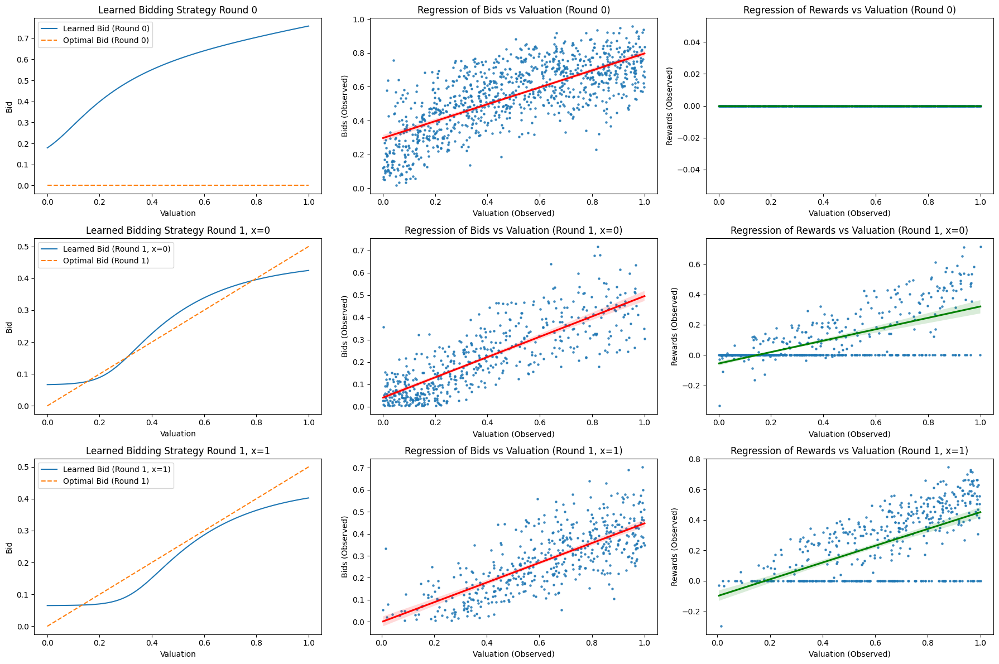

Iteration 20/1000, Average Rewards: [0.07997675595359684, 0.08000300230894831]


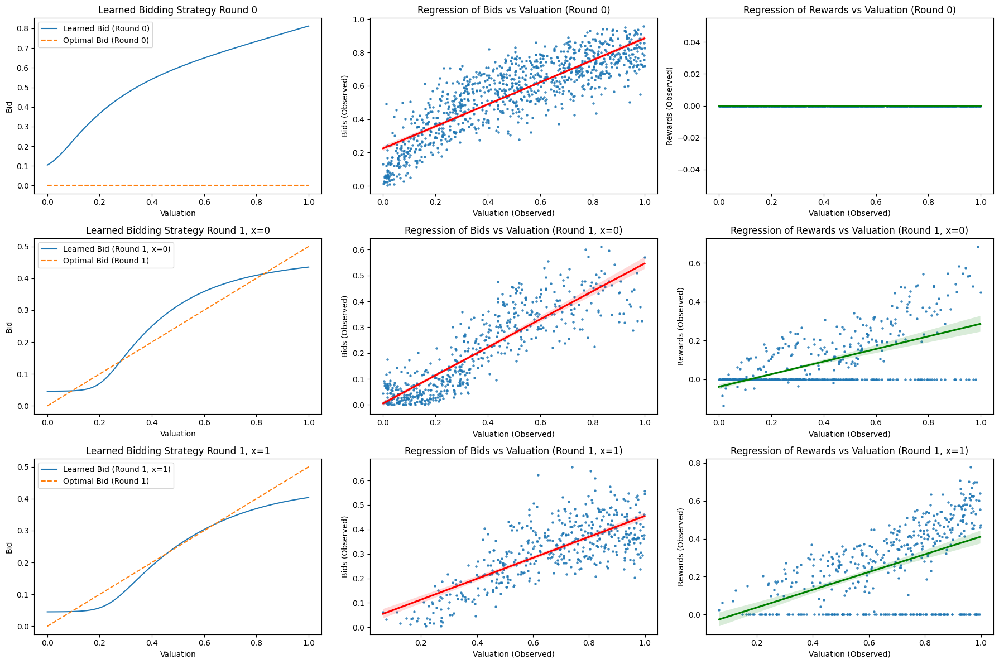

Iteration 30/1000, Average Rewards: [0.0880230596396332, 0.07926246148845356]


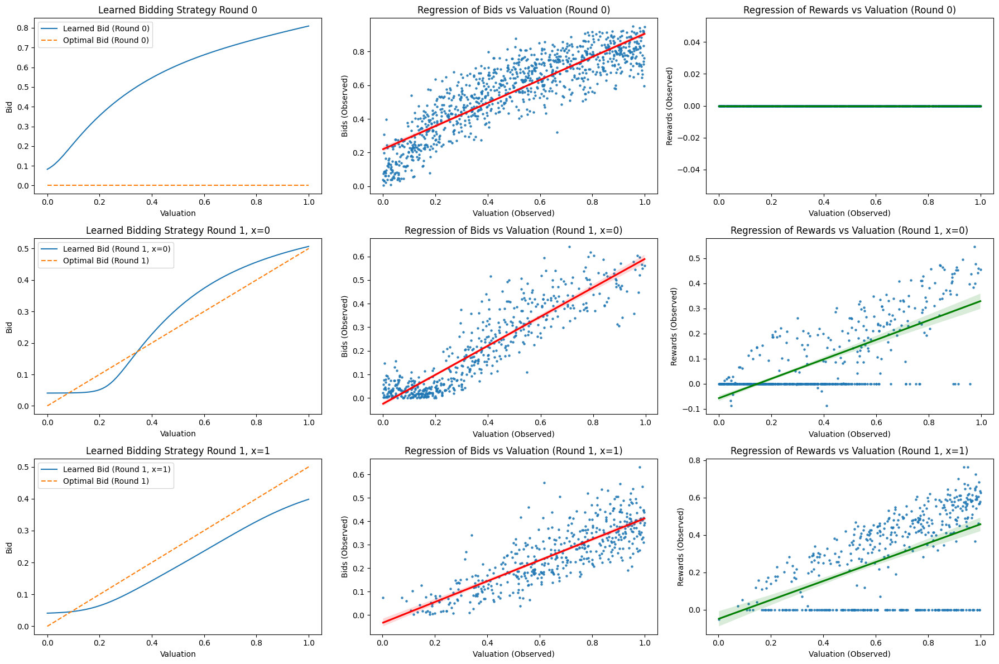

In [ ]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.distributions import Beta
import gym
from gym import spaces
import matplotlib.pyplot as plt
import seaborn as sns

# Define the Korean Auction Environment
class KoreanAuctionEnv(gym.Env):
    def __init__(self, num_agents=2, valuation_distribution=lambda: np.random.uniform(0, 1),
                 epsilon_reward=0.01, win_reward=0.01, tie_break_x0=True):
        super(KoreanAuctionEnv, self).__init__()
        self.num_agents = num_agents
        self.observation_space = spaces.Box(low=np.array([0.0, 0.0, 0.0]),
                                            high=np.array([1.0, 1.0, 1.0]),
                                            dtype=np.float32)
        self.action_space = spaces.Box(low=0.0, high=1.0, shape=(1,), dtype=np.float32)
        self.valuation_distribution = valuation_distribution
        self.epsilon_reward = epsilon_reward
        self.win_reward = win_reward
        self.tie_break_x0 = tie_break_x0
        self.reset()

    def reset(self):
        self.valuations = [self.valuation_distribution() for _ in range(self.num_agents)]
        self.holds_highest_bid = [0 for _ in range(self.num_agents)]
        self.time_step = 0  # 0 for first round, 1 for second round
        self.states = [np.array([v, self.holds_highest_bid[i], self.time_step], dtype=np.float32)
                       for i, v in enumerate(self.valuations)]
        return self.states

    def step(self, actions):
        bids = [np.clip(a[0], 0.0, 1.0) for a in actions]
        rewards = [0.0 for _ in range(self.num_agents)]
        info = {}

        if self.time_step == 0:
            bids_round1 = np.array(bids)
            max_bid = np.max(bids_round1)
            winner_indices = np.where(bids_round1 == max_bid)[0]
            if len(winner_indices) > 1 and self.tie_break_x0:
                self.holds_highest_bid = [0 for _ in range(self.num_agents)]
            else:
                winner = np.random.choice(winner_indices)
                self.holds_highest_bid = [1 if i == winner else 0 for i in range(self.num_agents)]
            self.time_step += 1
            self.states = [np.array([self.valuations[i], self.holds_highest_bid[i], self.time_step], dtype=np.float32)
                           for i in range(self.num_agents)]
            done = False
            info = {'bids_round1': bids_round1}

        elif self.time_step == 1:
            bids_round2 = np.array(bids)
            max_bid = np.max(bids_round2)
            winner_indices = np.where(bids_round2 == max_bid)[0]
            winner = np.random.choice(winner_indices)
            final_price = bids_round2[winner]
            for i in range(self.num_agents):
                if i == winner:
                    rewards[i] = self.valuations[i] - final_price + self.epsilon_reward + self.win_reward
                else:
                    rewards[i] = 0.0
            done = True
            info = {'bids_round2': bids_round2, 'winner_round2': winner, 'final_price': final_price}
            self.reset()

        next_states = self.states
        return next_states, rewards, done, info

    def render(self, mode='human'):
        pass


# Define the PPO Agent with Beta distribution
class PPOAgent:
    def __init__(self, observation_space, action_space, action_bound_method='clamp', lr=3e-4):
        self.observation_space = observation_space
        self.action_space = action_space
        self.action_bound_method = action_bound_method
        self.lr = lr

        # Actor network to output alpha and beta for Beta distribution
        self.actor_alpha = nn.Sequential(
            nn.Linear(observation_space.shape[0], 64),
            nn.Tanh(),
            nn.Linear(64, 64),
            nn.Tanh(),
            nn.Linear(64, action_space.shape[0])
        )

        self.actor_beta = nn.Sequential(
            nn.Linear(observation_space.shape[0], 64),
            nn.Tanh(),
            nn.Linear(64, 64),
            nn.Tanh(),
            nn.Linear(64, action_space.shape[0])
        )

        # Critic network
        self.critic = nn.Sequential(
            nn.Linear(observation_space.shape[0], 64),
            nn.Tanh(),
            nn.Linear(64, 64),
            nn.Tanh(),
            nn.Linear(64, 1)
        )

        self.optimizer = optim.Adam(self.parameters(), lr=self.lr)

    def parameters(self):
        return list(self.actor_alpha.parameters()) + list(self.actor_beta.parameters()) + list(self.critic.parameters())

    def get_action(self, x):
        alpha = F.softplus(self.actor_alpha(x)) + 1.0  # Ensure alpha > 1
        beta = F.softplus(self.actor_beta(x)) + 1.0   # Ensure beta > 1

        dist = Beta(alpha, beta)
        action = dist.sample()

        # Apply action bounding
        if self.action_bound_method == 'clamp':
            action = torch.clamp(action, 0.0, 1.0)
        elif self.action_bound_method == 'sigmoid':
            action = torch.sigmoid(action)
        elif self.action_bound_method == 'tanh':
            action = torch.tanh(action) * 0.5 + 0.5  # Rescale tanh output to [0,1]
        elif self.action_bound_method == 'none':
            action = action  # No action bounding
        else:
            raise ValueError("Invalid action bound method")

        log_prob = dist.log_prob(action).sum(dim=-1)
        return action, log_prob

    def get_value(self, x):
        return self.critic(x)

    def compute_loss(self, obs_batch, actions_batch, log_probs_old, returns, advantages, epsilon=0.2):
        alpha = F.softplus(self.actor_alpha(obs_batch)) + 1.0
        beta = F.softplus(self.actor_beta(obs_batch)) + 1.0

        dist = Beta(alpha, beta)

        # Apply the same action bounding during training
        if self.action_bound_method == 'clamp':
            actions_bound = torch.clamp(actions_batch, 0.0, 1.0)
        elif self.action_bound_method == 'sigmoid':
            actions_bound = torch.sigmoid(actions_batch)
        elif self.action_bound_method == 'tanh':
            actions_bound = torch.tanh(actions_batch) * 0.5 + 0.5
        elif self.action_bound_method == 'none':
            actions_bound = actions_batch
        else:
            raise ValueError("Invalid action bound method")

        log_probs = dist.log_prob(actions_bound).sum(dim=-1)
        ratios = torch.exp(log_probs - log_probs_old)
        surr1 = ratios * advantages
        surr2 = torch.clamp(ratios, 1 - epsilon, 1 + epsilon) * advantages
        actor_loss = -torch.min(surr1, surr2).mean()

        # Critic loss
        values = self.critic(obs_batch).squeeze()
        critic_loss = nn.MSELoss()(values, returns)

        # Entropy bonus
        entropy = dist.entropy().sum(dim=-1).mean()

        # Total loss
        loss = actor_loss + 0.5 * critic_loss - 0.005 * entropy
        return loss

    def update(self, loss):
        self.optimizer.zero_grad()
        loss.backward()
        self.optimizer.step()


# Training Parameters
num_iterations = 1000  # Number of training iterations
batch_size = 1000       # Number of episodes per iteration
learning_rate = 3e-3
gamma = 1.0           # No discounting since rewards are immediate
epsilon = 0.3         # PPO clipping epsilon
num_epochs = 4        # PPO epochs
num_minibatches = 4   # Number of minibatches for PPO update

# Create Environment and Agents
num_agents = 2  # Two agents
env = KoreanAuctionEnv(num_agents=num_agents, epsilon_reward=0.01, win_reward=0.01, tie_break_x0=False)
agents = [PPOAgent(env.observation_space, env.action_space, action_bound_method='clamp', lr=learning_rate)
          for _ in range(num_agents)]

# Training Loop (same as before)
for iteration in range(num_iterations):
    # Initialize data structures for each agent
    obs_batch = [[] for _ in range(num_agents)]  # List of observations per agent
    actions_batch = [[] for _ in range(num_agents)]
    rewards_batch = [[] for _ in range(num_agents)]
    log_probs_batch = [[] for _ in range(num_agents)]
    values_batch = [[] for _ in range(num_agents)]

    # To track observed bids and rewards for all agents
    observed_valuations = [[] for _ in range(num_agents)]
    observed_bids = [[] for _ in range(num_agents)]
    observed_rewards = [[] for _ in range(num_agents)]
    observed_rounds = [[] for _ in range(num_agents)]
    observed_holds_highest_bid = [[] for _ in range(num_agents)]

    # Collect data over batch_size episodes
    for _ in range(batch_size):
        # Reset environment
        states = env.reset()
        done = False
        # Initialize lists for this episode
        obs_episode = [[] for _ in range(num_agents)]
        actions_episode = [[] for _ in range(num_agents)]
        rewards_episode = [[] for _ in range(num_agents)]
        log_probs_episode = [[] for _ in range(num_agents)]
        values_episode = [[] for _ in range(num_agents)]
        while not done:
            actions = []
            for i in range(num_agents):
                obs = states[i]
                obs_tensor = torch.tensor(obs, dtype=torch.float32).unsqueeze(0)
                action, log_prob = agents[i].get_action(obs_tensor)
                value = agents[i].get_value(obs_tensor)

                action_np = action.detach().numpy()[0]
                actions.append(action_np)

                # Store data
                obs_episode[i].append(obs)
                actions_episode[i].append(action_np)
                log_probs_episode[i].append(log_prob.detach().numpy())
                values_episode[i].append(value.detach().numpy()[0])

            # Step environment with all actions
            next_states, rewards, done, info = env.step(actions)

            # Track observed data for all agents
            for i in range(num_agents):
                observed_valuations[i].append(states[i][0])  # Valuation for agent i
                observed_bids[i].append(actions[i])          # Bid for agent i
                observed_rewards[i].append(rewards[i])       # Reward for agent i
                observed_rounds[i].append(states[i][2])      # Round number
                observed_holds_highest_bid[i].append(states[i][1])  # Holds highest bid

            # Store rewards
            for i in range(num_agents):
                rewards_episode[i].append(rewards[i])

            # Update states
            states = next_states

        # After episode ends, append episode data to batches
        for i in range(num_agents):
            obs_batch[i].extend(obs_episode[i])
            actions_batch[i].extend(actions_episode[i])
            rewards_batch[i].extend(rewards_episode[i])
            log_probs_batch[i].extend(log_probs_episode[i])
            values_batch[i].extend(values_episode[i])

    # PPO Update for each agent
    for i in range(num_agents):
        # Flatten lists
        obs_batch_i = torch.tensor(obs_batch[i], dtype=torch.float32)
        actions_batch_i = torch.tensor(actions_batch[i], dtype=torch.float32)
        log_probs_batch_i = torch.tensor(log_probs_batch[i], dtype=torch.float32).squeeze()
        values_batch_i = torch.tensor(values_batch[i], dtype=torch.float32).squeeze()
        rewards_batch_i = torch.tensor(rewards_batch[i], dtype=torch.float32)

        # Compute Returns and Advantages
        returns = rewards_batch_i
        advantages = returns - values_batch_i.detach()

        # Normalize Advantages
        advantages = (advantages - advantages.mean()) / (advantages.std() + 1e-8)

        # PPO Update
        for _ in range(num_epochs):
            indices = np.arange(len(returns))
            np.random.shuffle(indices)
            minibatch_size = len(returns) // num_minibatches
            for start in range(0, len(returns), minibatch_size):
                end = start + minibatch_size
                mb_inds = indices[start:end]

                mb_obs = obs_batch_i[mb_inds]
                mb_actions = actions_batch_i[mb_inds]
                mb_log_probs_old = log_probs_batch_i[mb_inds]
                mb_advantages = advantages[mb_inds]
                mb_returns = returns[mb_inds]

                # Compute loss
                loss = agents[i].compute_loss(mb_obs, mb_actions, mb_log_probs_old, mb_returns, mb_advantages, epsilon)

                # Update agent
                agents[i].update(loss)

    # Optional: Print progress and plot every 10 iterations
    if (iteration + 1) % 10 == 0:
        avg_rewards = [np.mean(rewards_batch[i]) for i in range(num_agents)]
        print(f"Iteration {iteration + 1}/{num_iterations}, Average Rewards: {avg_rewards}")

        # Focus only on Agent 1 (index 0)
        agent_idx = 0

        valuations = np.linspace(0, 1, 100)
        bids_agent_round0 = []
        bids_agent_round1_x0 = []
        bids_agent_round1_x1 = []
        for v in valuations:
            obs_tensor = torch.tensor([v, 0.0, 0.0], dtype=torch.float32).unsqueeze(0)
            with torch.no_grad():
                alpha = F.softplus(agents[agent_idx].actor_alpha(obs_tensor)) + 1.0
                beta = F.softplus(agents[agent_idx].actor_beta(obs_tensor)) + 1.0
                action_mean = alpha / (alpha + beta)  # Mean of Beta distribution
            bids_agent_round0.append(action_mean.numpy()[0])

            obs_tensor = torch.tensor([v, 0.0, 1.0], dtype=torch.float32).unsqueeze(0)
            with torch.no_grad():
                alpha = F.softplus(agents[agent_idx].actor_alpha(obs_tensor)) + 1.0
                beta = F.softplus(agents[agent_idx].actor_beta(obs_tensor)) + 1.0
                action_mean = alpha / (alpha + beta)
            bids_agent_round1_x0.append(action_mean.numpy()[0])

            obs_tensor = torch.tensor([v, 1.0, 1.0], dtype=torch.float32).unsqueeze(0)
            with torch.no_grad():
                alpha = F.softplus(agents[agent_idx].actor_alpha(obs_tensor)) + 1.0
                beta = F.softplus(agents[agent_idx].actor_beta(obs_tensor)) + 1.0
                action_mean = alpha / (alpha + beta)
            bids_agent_round1_x1.append(action_mean.numpy()[0])

        observed_valuations_agent = np.array(observed_valuations[agent_idx])
        observed_bids_agent = np.array(observed_bids[agent_idx])
        observed_rewards_agent = np.array(observed_rewards[agent_idx])
        observed_rounds_agent = np.array(observed_rounds[agent_idx])
        observed_holds_highest_bid_agent = np.array(observed_holds_highest_bid[agent_idx])

        fig, axes = plt.subplots(3, 3, figsize=(18, 12))

        axes[0, 0].plot(valuations, bids_agent_round0, label='Learned Bid (Round 0)')
        optimal_bids_round_0 = np.zeros_like(valuations)
        axes[0, 0].plot(valuations, optimal_bids_round_0, label='Optimal Bid (Round 0)', linestyle='--')
        axes[0, 0].set_xlabel('Valuation')
        axes[0, 0].set_ylabel('Bid')
        axes[0, 0].set_title('Learned Bidding Strategy Round 0')
        axes[0, 0].legend()

        idx_round0 = observed_rounds_agent == 0
        sns.regplot(x=observed_valuations_agent[idx_round0], y=observed_bids_agent[idx_round0],
                    scatter_kws={'s':5}, line_kws={"color":"r"}, ax=axes[0, 1])
        axes[0, 1].set_xlabel('Valuation (Observed)')
        axes[0, 1].set_ylabel('Bids (Observed)')
        axes[0, 1].set_title('Regression of Bids vs Valuation (Round 0)')

        sns.regplot(x=observed_valuations_agent[idx_round0], y=observed_rewards_agent[idx_round0],
                    scatter_kws={'s':5}, line_kws={"color":"g"}, ax=axes[0, 2])
        axes[0, 2].set_xlabel('Valuation (Observed)')
        axes[0, 2].set_ylabel('Rewards (Observed)')
        axes[0, 2].set_title('Regression of Rewards vs Valuation (Round 0)')

        axes[1, 0].plot(valuations, bids_agent_round1_x0, label='Learned Bid (Round 1, x=0)')
        optimal_bids_round_1 = 0.5 * valuations
        axes[1, 0].plot(valuations, optimal_bids_round_1, label='Optimal Bid (Round 1)', linestyle='--')
        axes[1, 0].set_xlabel('Valuation')
        axes[1, 0].set_ylabel('Bid')
        axes[1, 0].set_title('Learned Bidding Strategy Round 1, x=0')
        axes[1, 0].legend()

        idx_round1_x0 = (observed_rounds_agent == 1) & (observed_holds_highest_bid_agent == 0)
        sns.regplot(x=observed_valuations_agent[idx_round1_x0], y=observed_bids_agent[idx_round1_x0],
                    scatter_kws={'s':5}, line_kws={"color":"r"}, ax=axes[1, 1])
        axes[1, 1].set_xlabel('Valuation (Observed)')
        axes[1, 1].set_ylabel('Bids (Observed)')
        axes[1, 1].set_title('Regression of Bids vs Valuation (Round 1, x=0)')

        sns.regplot(x=observed_valuations_agent[idx_round1_x0], y=observed_rewards_agent[idx_round1_x0],
                    scatter_kws={'s':5}, line_kws={"color":"g"}, ax=axes[1, 2])
        axes[1, 2].set_xlabel('Valuation (Observed)')
        axes[1, 2].set_ylabel('Rewards (Observed)')
        axes[1, 2].set_title('Regression of Rewards vs Valuation (Round 1, x=0)')

        axes[2, 0].plot(valuations, bids_agent_round1_x1, label='Learned Bid (Round 1, x=1)')
        axes[2, 0].plot(valuations, optimal_bids_round_1, label='Optimal Bid (Round 1)', linestyle='--')
        axes[2, 0].set_xlabel('Valuation')
        axes[2, 0].set_ylabel('Bid')
        axes[2, 0].set_title('Learned Bidding Strategy Round 1, x=1')
        axes[2, 0].legend()

        idx_round1_x1 = (observed_rounds_agent == 1) & (observed_holds_highest_bid_agent == 1)
        sns.regplot(x=observed_valuations_agent[idx_round1_x1], y=observed_bids_agent[idx_round1_x1],
                    scatter_kws={'s':5}, line_kws={"color":"r"}, ax=axes[2, 1])
        axes[2, 1].set_xlabel('Valuation (Observed)')
        axes[2, 1].set_ylabel('Bids (Observed)')
        axes[2, 1].set_title('Regression of Bids vs Valuation (Round 1, x=1)')

        sns.regplot(x=observed_valuations_agent[idx_round1_x1], y=observed_rewards_agent[idx_round1_x1],
                    scatter_kws={'s':5}, line_kws={"color":"g"}, ax=axes[2, 2])
        axes[2, 2].set_xlabel('Valuation (Observed)')
        axes[2, 2].set_ylabel('Rewards (Observed)')
        axes[2, 2].set_title('Regression of Rewards vs Valuation (Round 1, x=1)')

        plt.tight_layout()
        plt.show()
